# **Week 1**: *Explore the Use Case and Analyze the Dataset*
***

## Practical Data Science
**Artificial intelligence (AI)** is generally described as a technique that lets machines mimic human behavior. It has been studied since the 1950s. **Machine learning (ML)** is a subset of AI, that uses statistical methods and algorithms that are able to learn from data, without being programmed. **Deep learning (DL)** is a subset of machine learning that uses neural networks to learn from data. 

**Data science (DS)** is a interdisciplinary field that combines business and domain knowledge with mathematics, statistics, data visualization, and programming skills, as well as all the previous fields mentioned above. 

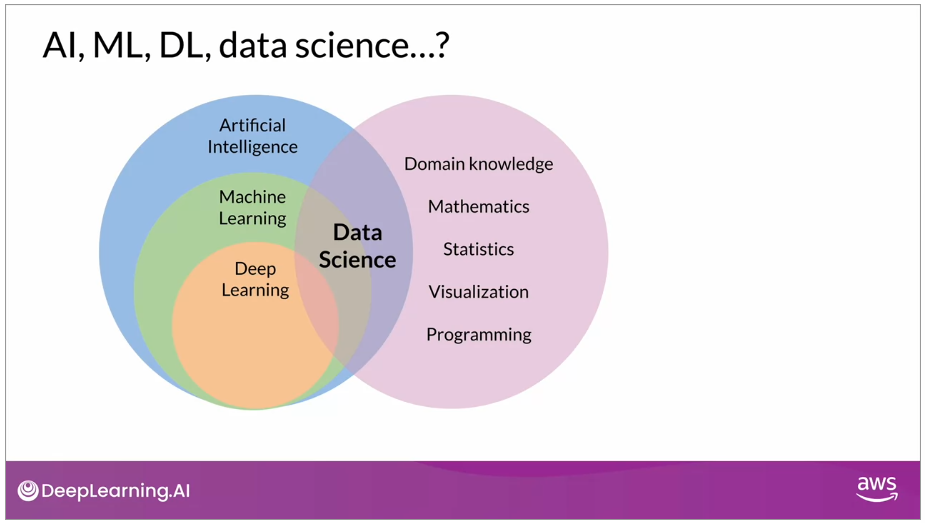

**Practical data science** helps you to improve your data science and machine learning skills, work with almost any amount of data, and implement their use cases in the most efficient way. This means that it is geared towards handling massive datasets, that could originate from social media channels, mobile and web applications, public or company internal data sources, and much more. This data is often messy, potentially error-hidden, or even poorly documented. Practical data science tackles these issues by providing tools to analyze and clean the data and extract relevant features. The ultimate goal of practical data science is knowledge distillation and gaining insight from those large datasets. 

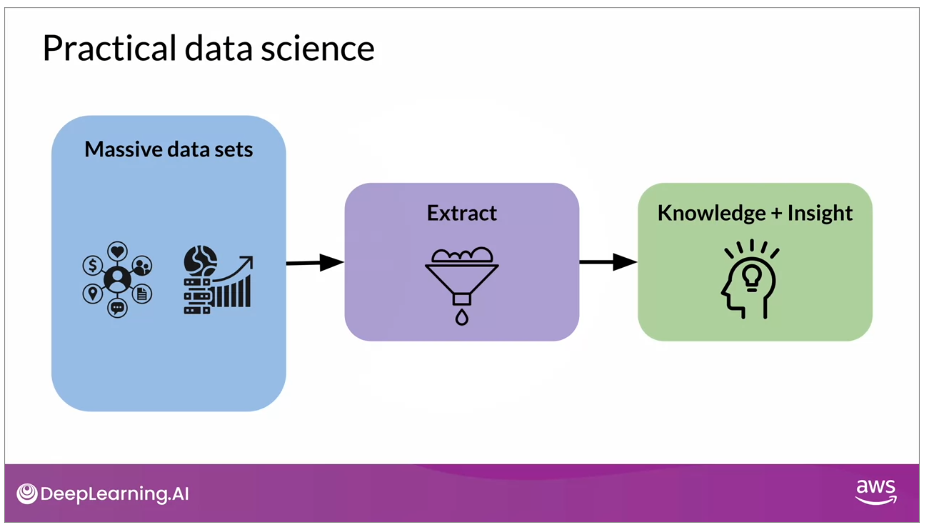

Doing practical data science in the **cloud** mitigates the limitations of the exiting hardware, by providing a scalable and on-demand hardware service. This results in an *elastic infrastructure*, easing the scale up (improve vertically the CPU or hardware used) and the scale out (use multiple hardware instances to scale horizontally). As well as you can pay what you use. 

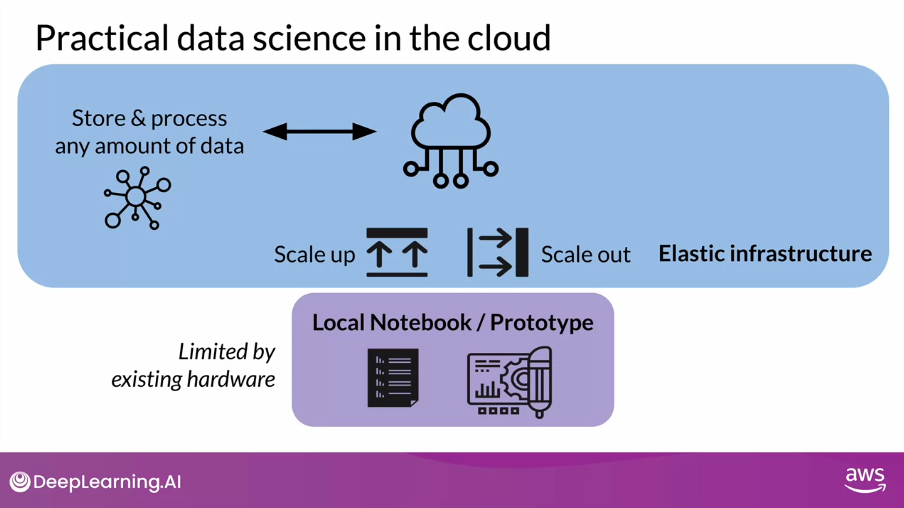

The cloud also comes with a large data science and ML toolbox. You will use **Amazon Simple Storage Service (AWS S3)** and **Amazon Athena** to store and query the data. With **AWS Glue** you will catalog the data in a schema. For statistical bias detection in data, you will learn how to work with **AWS Data Wrangles** and **AWS Clarify**.

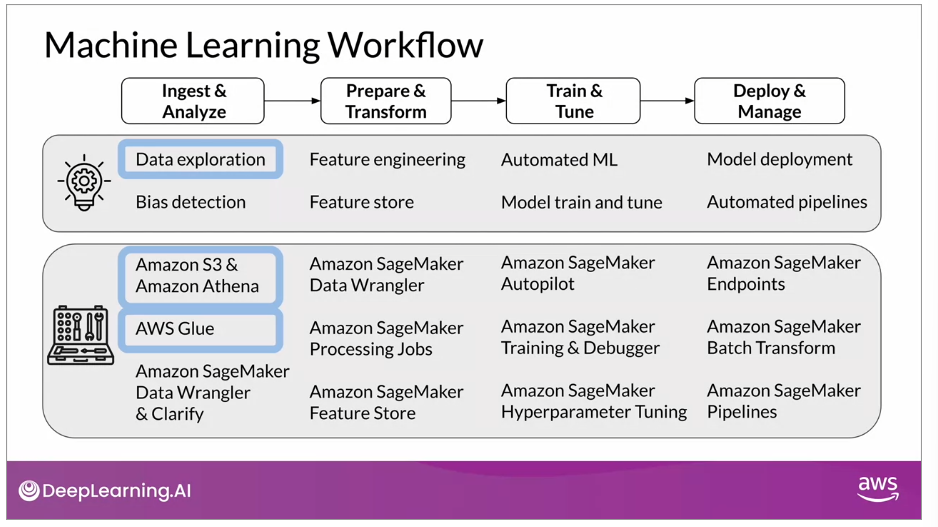

For the *preparation and transformation* of the data, you will have available useful tools in AWS. This is the same for the *model training and tuning* phase. 

## Data Ingestion and Exploration
One key advantage of performing data science in the cloud is that you can store virtually any amount of data in the cloud. This is because the infrastructure scales elastically with the amount of data. You may also need a flexible and elastic repository that can store not only different file formats (*e.g.* structured data, CSV files, unstructured data like audio files). 

Cloud based data lakes address this problem. A **data lake** is a centralized and secure repository that can store, discover and share data at any scale, where you can ingest structured relational data (CSV), semi-structured data (JSON), as well as unstructured data (images, audio files). You can also ingest streaming data from an application. You need governance, so that you implement ways to discover and catalog new data. You also need to secure and control access to the data to comply with the political data security, privacy and governance regulations.

Data lakes are often built on top of object storage, such as Amazon S3. With *file storage* you manage data as individual files organized in hierarchical file folder structures. *Block storage* manages data as individual chunks called the blocks, each block receives a unique identifier, but no additional metadata is stored with that block. 

With ***object storage*** data is stored and managed as objects, which consists of the data itself, any relevant metadata (*e.g.* last modification date, unique identifier). It is particularly helpful for storing and retrieving growing amount of data of any type, hence it's the perfect foundation for data lakes. S3 gives you access to durable and highly-available object storage in the cloud. You can ingest virtually anything, from just a few dataset files, to exabytes of data. AWS also provides additional tools and services to assist you in building a secure, compliant and auditable lake on top of S3.

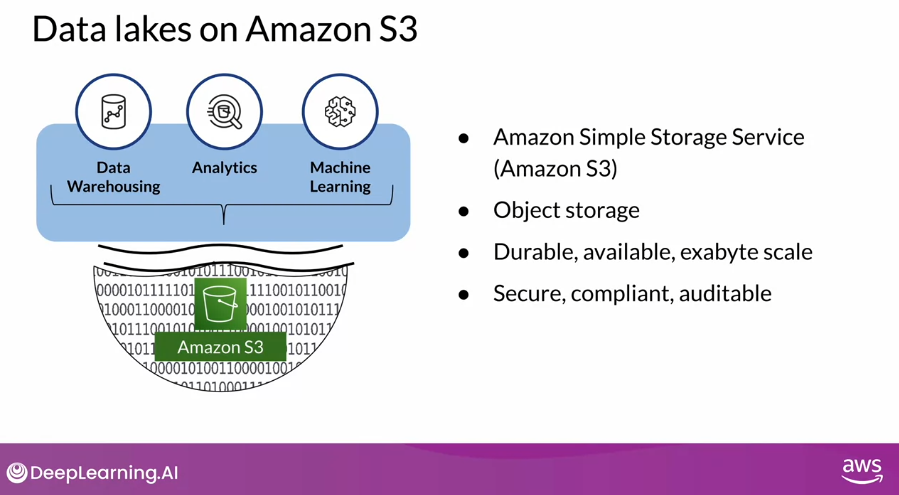

With a data lake in place, you can now use this centralized data repository to enable data warehousing analytics and also machine learning.

### AWS Data Wrangler
**AWS Data Wrangler** is an open-source Python library, developed by members of the AWS professional services team. This library connects Pandas DataFrames with AWS data-related services. It offers abstracted functions to load or unload data from data lakes, data warehouses, or databases on AWS. You can install the library through `pip install awswrangler` command. 

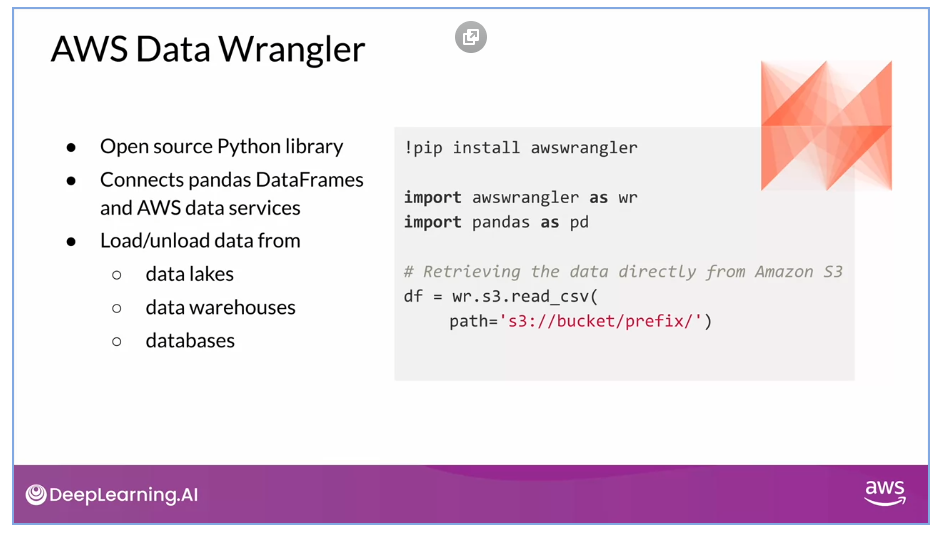



### AWS Glue Data Catalog
**AWS Glue Data Catalog** is used to register or catalog the data stored in S3. Similar to taking inventory in a shop, you need to know what data is stored in your S3 data lake, or bucket, as an individual container for objects is called. Using the Data Catalog Service, you create a reference to the data, basically S3 to table mapping. The AWS Glue table, which is created inside an AWS Glue database, only contains the metadata information such as the data schema. It's important to note that no data is moved. All the data remains in your S3 location. 

Instead of manually registering the data, you can also use **AWS Glue Crawler**, which can be used and set up to run on a schedule or to automatically find new data, which includes inferring the data schema and also update the data catalog.

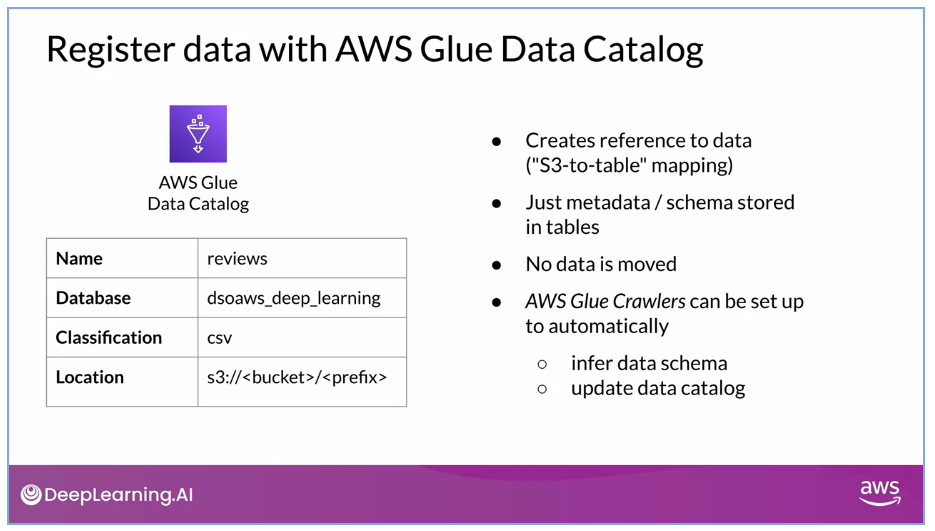

To register data you can use the AWS Data Wrangler tool.

1. Create an AWS Glue Data Catalog database
2. Create a  CSV table where you can register the CSV data with the AWS Glue Catalog table

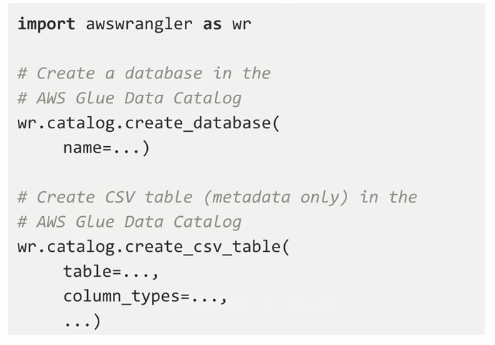

**Then you can query your data with Amazon Athena**. Athena is an interactive query service that lets your run standard SQL queries to explore your data. Athena is serverless, which means you don't need to set up any infrastructure to run those queries, and no matter how large the data is that you want to query, you can simply type your SQL query.

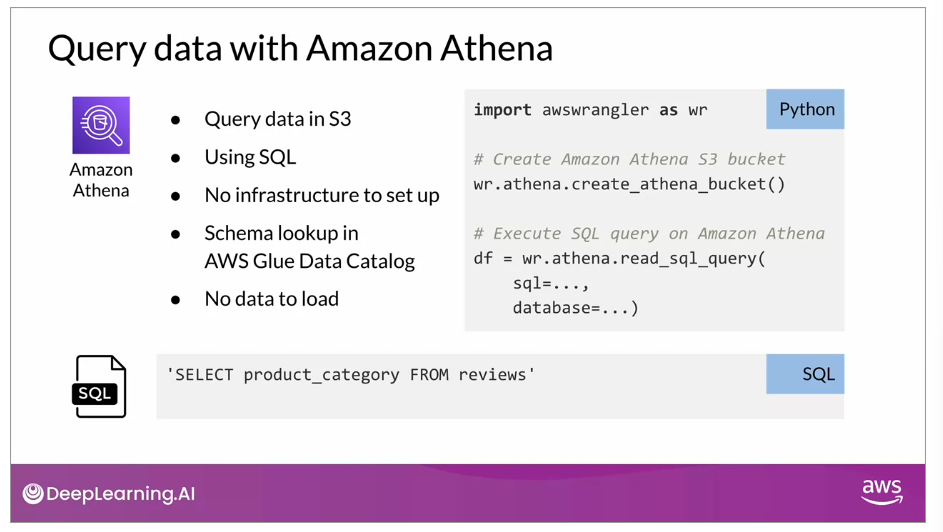

As you can see  in the example above, to use Amazon Athena we can use `awswrangler` once again. To the `wr.athena.real_sql_query` function you pass the SQL query you want, and point to the AWS Glue database, which contains the table you'll reference in the SQL query. This database and table only contains the metadata of your data. The data still resides in S3, and when you run this Python command, AWS Data Wrangler will send this SQL query to Amazon Athena. Athena then runs the query on the specified dataset and stores the results in S3, and it also returns in a Pandas DataFrame.

This is very useful for writing complex analytical queries, which could involve very high volumes of data. Using Athena, you don't have to worry about any compute and memory resources to support this query, because Athena will automatically scale out and split the query into simpler queries to run in parallel against your data.

## Data Visualization
Data visualization is one of the most effective ways of exploring your data across multiple dimensions at once. Depending on what kind of data you're exploring and what kind of relationships in the data you're looking for, the type of visualizations you use might be different. 

# **Week 2**: *Data Bias and Feature Importance*
***

## Statistical Bias
A dataset is considered to be biased if cannot completely and accurately represent the underlying problem space. In statistics **statistical bias** is a tendency of a statistic to either overestimate or underestimate a parameter. 

Statistical biases in training datasets are imbalances in the dataset, where some elements of the dataset are more heavily represented than others. An example of these are the fraud detection problems, where you want to detect the fraudulent transactions, which are rare. This results in a model that is unlikely to detect fraud because it has not seen that many fraudulent transactions before.

One way to address this problem is to add more examples of how a fraud transaction would look like to your training dataset. Biased datasets typically lead to biased models, and the biased models could have both business and regulatory consequences for the business that use these models.

### Statistical Bias Causes
There could be multiple reasons for the presence of statistical bias:

+ **Activity bias**: biases that exist in human-generated content, especially on social media (*e.g.* the actively participating users are a small proportion of the total population on social media, making it not representative)
+ **Societal bias**: biases in data that is generated by humans, that could be introduced because of preconceived notions that exist in society (*e.g.* unconscious biases) 
+ **Selection bias**: introduced by the machine learning system (*e.g.*  machine learning application giving few selection options, once the user select an option, the user selection is sued as training data to further train and improve the model, which generates a *feedback loop*)
+ **Data drift**: happens especially when the data distribution significantly varies from the distribution of the training data that was used to initially train the model. There are different types of data drift:
    + *Covariant drift*: the distribution of the independent variables or features that make up your dataset can change.
    + *Probability drift*: the data distribution of our labels or target variables might change. This is prior probability drift.
    + *Concept drift*: the relationship between the two, that is the relationship between the features and the labels can change. This could also be caused because the definition of the label changes based on a particular feature (*e.g.* age or geographical location)

With all this issues that could happen, you should constantly monitor for the various biases that could arise on your training data, before and after you've trained your models.

### Measuring Statistical Bias
When talking about bias metrics, we need to understand that they are applicable to a particular facet of the dataset. A **facet** is a sensitive feature in your dataset, that you want to analyze for these imbalances. There are several metrics corresponding to different types of bias:

1. **Class imbalance (CI)**: measures the imbalance in the numbers of members (instances) between different facet values
1. **Difference in proportions of labels (DPL)**: measures the imbalance of positive outcomes between different facet values.


## Detecting Statistical Bias
In AWS we have two tools that can help to detect statistical bias in the training datasets: i) *Amazon SageMaker Data Wrangler*; and ii) *Amazon SageMaker Clarify*.

**Data Wrangler** provides you with capabilities to connect to various different sources for your data, visualize the data, and transform the data, by applying any number of transformations in the Data Wrangler environment, and  detect statistical bias in your data sets, and generate reports about the bias detected in those datasets. It also provides capabilities to provide feature importance calculations on your training dataset. 

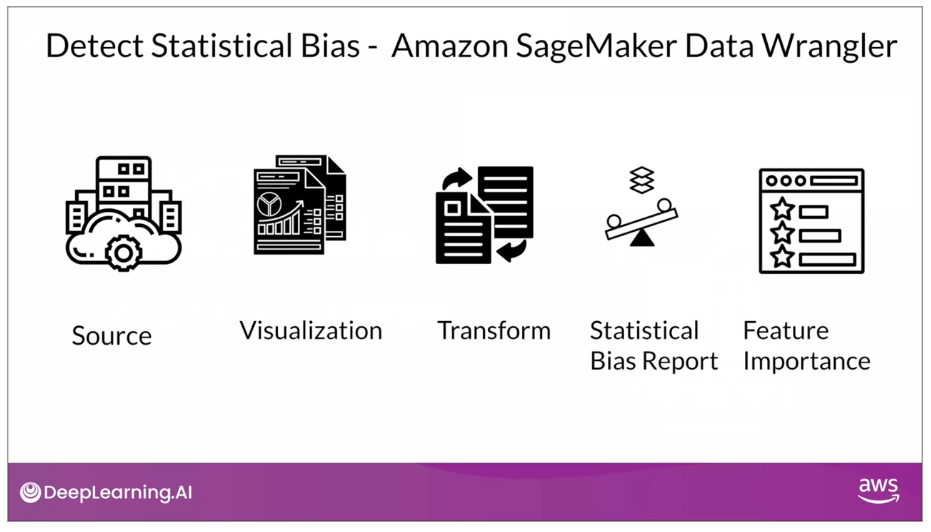

### Detect Statistical Bias with Amazon SageMaker Clarify
**SageMaker Clarify** can perform statistical bias detection and generate bias reports on your training datasets. Additionally, it can also perform bias detection in trained and deployed models. It further provides capabilities for machine learning explainability, as well as detecting drift in data and models.

To use SageMaker Clarify we start by importing the library, and then construct the `SageMakerClarifyProcessor` object. This object allows you to scale the bias detection process into a distributed cluster. By using two parameters, instance type and instance count, you can scale up the distributed cluster to the capacity that you need. 

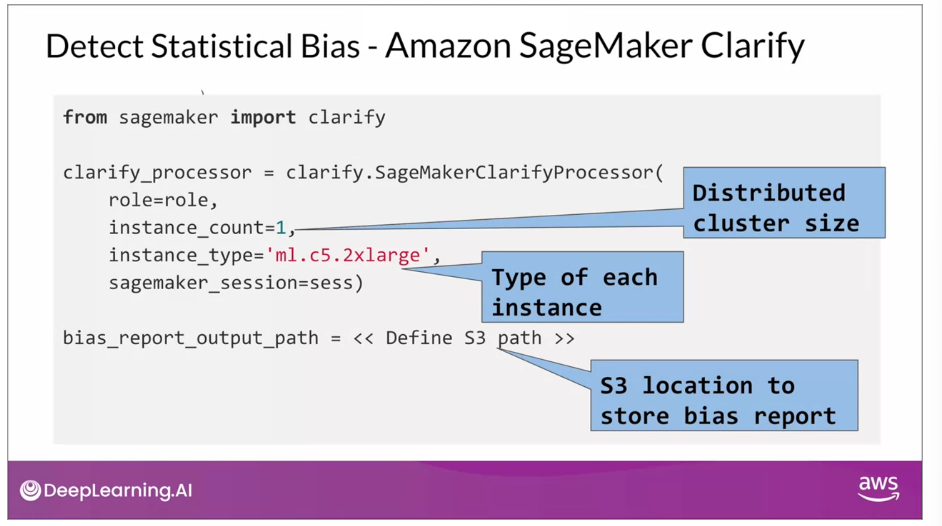

*Instance count* represents the number of nodes that are included in the cluster, and *instance type* represents the processing capacity of each individual node in the cluster.  The processing capacity is measured by the node's compute capacity, memory, and the network.

Once you have configured the distributed cluster you then specify an S3 location, where you want the bias report to be saved.

Next you instanciate a `DataConfig` object, which represents the details about your data. The input and output S3 location of your data, as well as the label that you are trying to predict. 

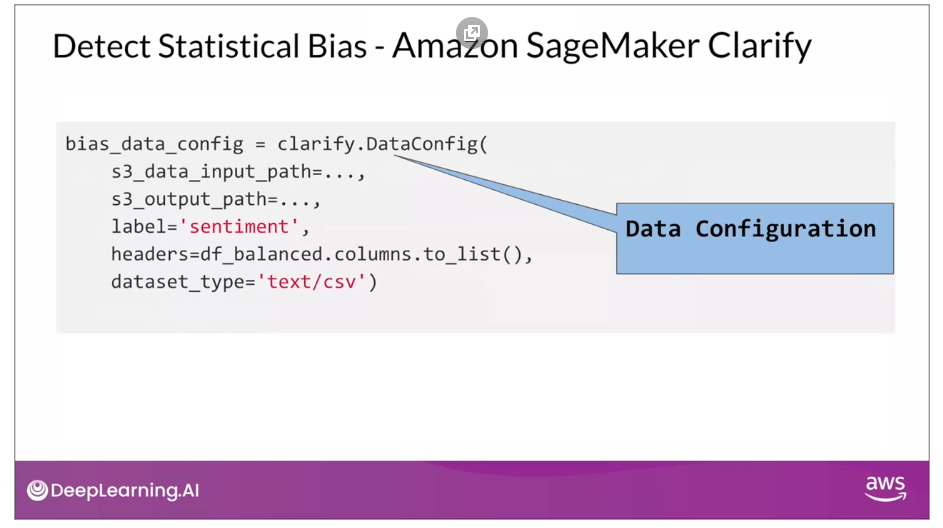

Next you  use the `BiasConfig` object, which captures the facet or the feature name that you are trying to evaluate for bias or imbalances. The parameter `label_values_or_threshold` defines the desired values for the labels. So if  the sentiment feature is your label, what is the desired value for that label?

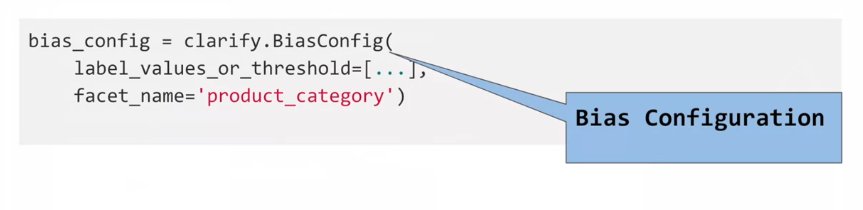

Once you have this, you then use the method `.run_pre_training_bias` from the `SageMakerClarify` instance. In addition to the `DataConfig` and `BiasConfig` objects you have previously defined, here you specify the methods that your want to evaluate for bias (*e.g.* DPL, CI). The `wait` parameter specifies whether this bias detection job should block the rest of your code or should it be executed in the background. The `logs` parameter specify whether you want to capture the logs or not.

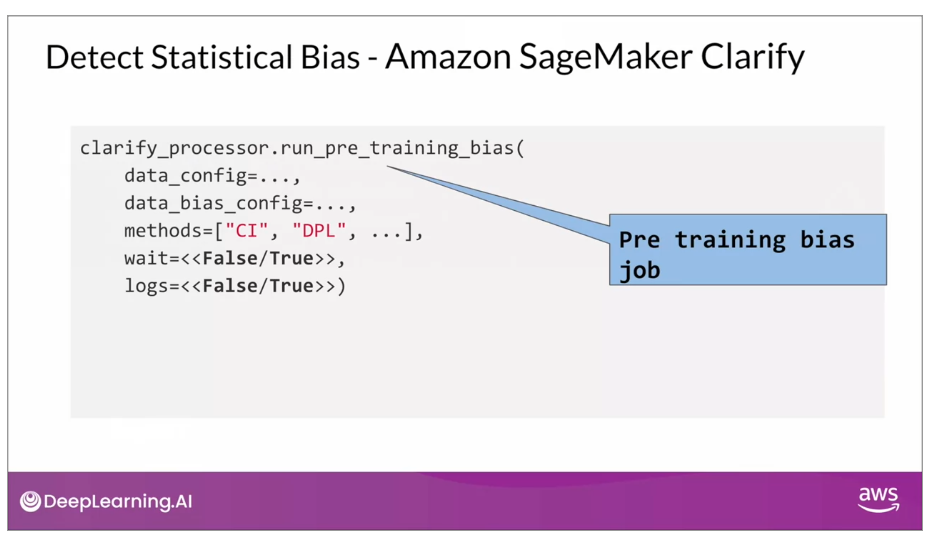

In the background, SageMaker Clarify is using a construct called SageMaker Processing Job to execute the bias detection at scale. SageMaker Processing Job is a construct that allows you to perform any data-related tasks at scale. These tasks could be executing pre-processing, or post-processing tasks, or even using data to evaluate your model. 

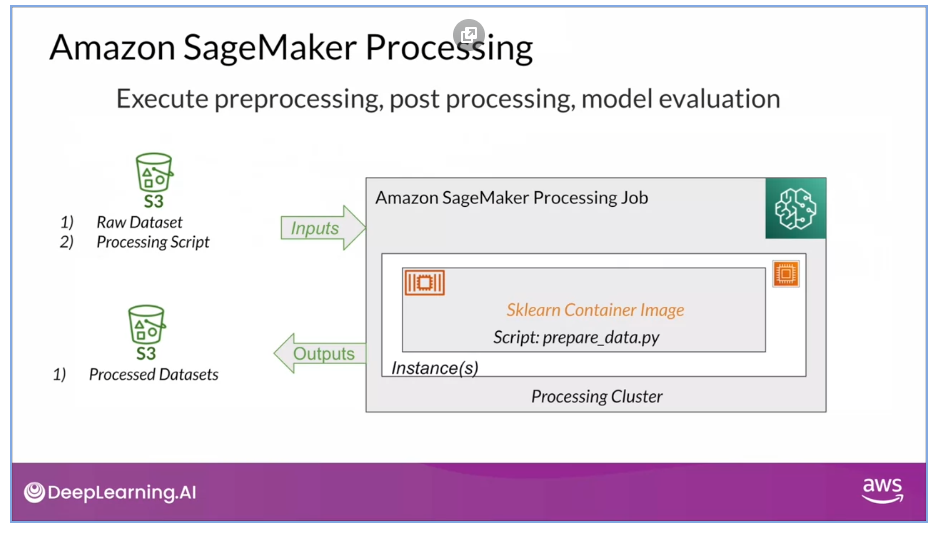

As you can see in the figure, the SageMaker Processing Job expects the data to be in an S3 bucket. The data is collected from the S3 bucket and processed on this processing cluster which contains a variety of containers in the cluster. By default, containers for Sklearn, Python, and a few others are supported. You can also have the opportunity to bring your own custom container as well. Once the processing cluster has processed the data, the transformed data or the processed data is put back on the S3 bucket.

### Approaches to Statistical Bias Detection
+ **SageMaker Data Wrangler**: this option provides you with more of a UI-based visual experience. If you would like to connect to multiple data sources and explore your data in more visual format, and configure what goes into your bias reports by making selections from drop-down boxes and option buttons, and finally launch the bias detection job using a button click, this is the option for you.
+ **SageMaker Clarify**: this option provides you with an API approach that gives you the ability to scale out the bias detection process. It uses a construct called *processing jobs* that allow you to configure a distributed cluster to execute your bias detection job at scale. Thus, if you're thinking of large volumes of data (*e.g.* millions of millions of rows of product reviews) and you want to explore that data set for bias, then this is the best tool to take advantage of the scalability aloud with cloud.

## Feature Importance: SHAP
**Feature importance** is the idea of explaining the individual features that make up your training dataset, using a score called *importance score*. The intuition is that some features are more relevant for your final model than others. Using features importance you can rank the individual feature in the order of their importance and contribution to the final model.

To measure this we will use an open source framework called SHAP (Shapley Additive Explanations). This framework is based on Shapley values, which in turn are based on game theory. Consider a game in which multiple players are involved and there is a very specific outcome to the play that could be either a win or a loss. Shapley values allow you to attribute the outcome of the game to the individual players involved in the game. You can use this concept to explain the predictions made by the machine learning model. In this case, the individual players would be the individual features that make up the data set, and the outcome of the play would be the machine learning model prediction. **Using this concept, you can explain how the predictions will correlate to the individual feature values that make up your training dataset**.

Using the SHAP framework you can provide both local and global explanations. The local explanation focuses on indicating how an individual feature contributes to the final model; the global explanation takes a much more comprehensive view in trying to understand how the data in its entirety contributes to the final outcome from the machine learning model.

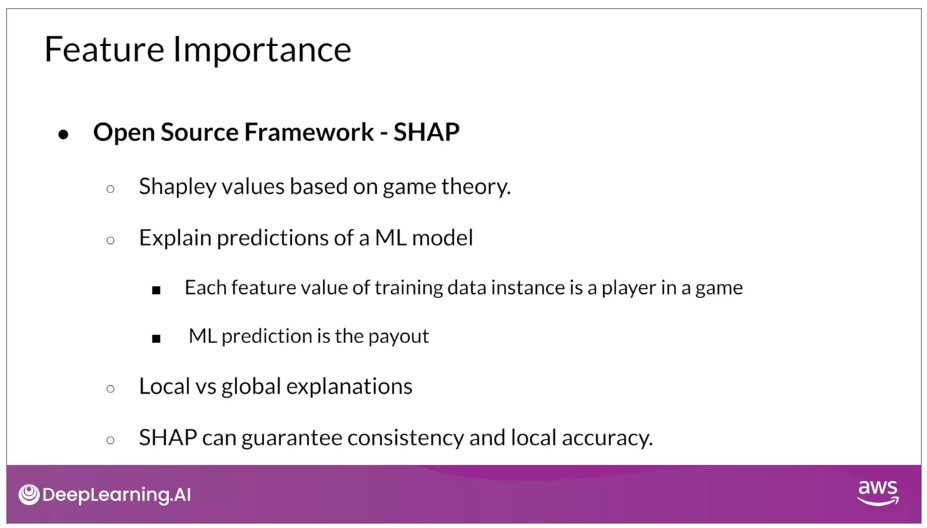

SHAP considers all possible combinations of feature values along with all possible outcomes for your machine learning model. Because this extensive nature, the SHAP framework could be very time intensive, but also SHAP provide you with guarantees in terms of consistency and local accuracy. 

To calculate feature importance with Data Wrangler we go to Amazon SageMaker Studio homepage. Then you go the `New data flow`. There you can add multiple data sources (such as Amazon S3 and Amazon Athena). There you select the data where you want to calculate the feature importance. Once you have reviewed the fields detected and you are satisfied with the data then you `import the dataset`. That action brings the data from the S3 bucket to the Data Wrangler environment. 

Then you select the `Analysis type` `Quick Model` to compute the feature importance calculation of the dataset. Then you name your analysis and select the label or target variable. Then you `Preview` the results of the analysis, where Data Wrangler starts working in the background to create a quick model out of a subset of your data. It uses 70% of the subset of the data for training and 30% for test. 

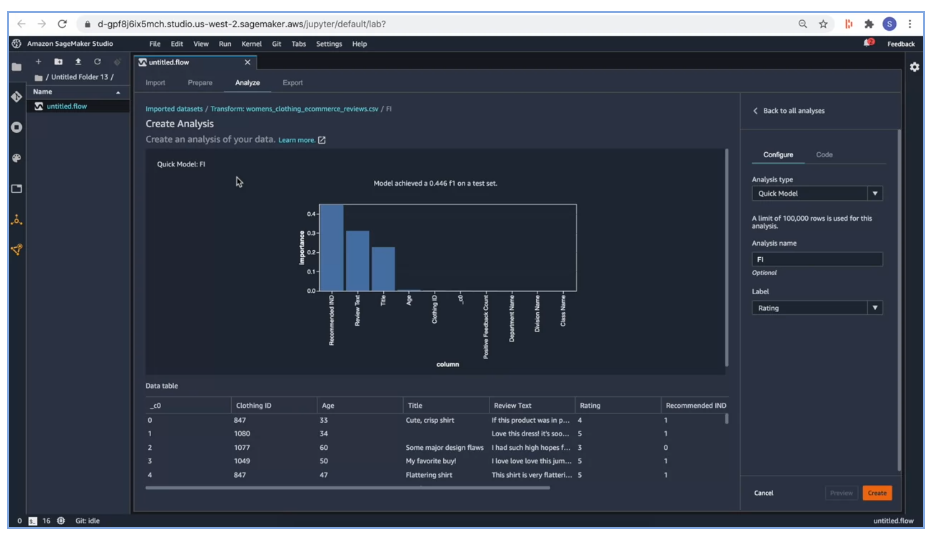

Once you have seen the results you could use your business knowledge to analyze the reasons of the results, and determine whether you need to make further feature engineering, drop some columns or continue with the modeling phase.

***[SHAP Library](https://shap.readthedocs.io/en/latest/)***

***
## An Introdcution to Explainable AI with Shapley Values
**Shapley values** are a widely used approach from cooperative game theory that come with desirable propoerties. Below we will see a hands-on tutorial to use the `shap` library so that you can understand and interpret these values.

In [2]:
import pandas as pd
import shap
import sklearn

# Call the California Housing dataset
x, y = shap.datasets.california(n_points=1000)

# Sample 100 instances for use as the background distribution
x_100 = shap.utils.sample(x, 100)

# Generate a simple linear model
model = sklearn.linear_model.LinearRegression()
model.fit(x, y)

LinearRegression()

The most common way to understand a linear model is to examine the coefficients learned for each feature. These coefficients tell us how much the model output changes when we change each of the input features:

In [3]:
# Linear regression model coefficients
title = 'Model Coefficients'
print(title + '\n' + '-' * len(title))
for i, col in enumerate(x.columns):
    print(col + ' = ' + str(model.coef_[i].round(5)))

Model Coefficients
------------------
MedInc = 0.45769
HouseAge = 0.01153
AveRooms = -0.12529
AveBedrms = 1.04053
Population = 5e-05
AveOccup = -0.29795
Latitude = -0.41204
Longitude = -0.40125


Coefficients are great in telling us what happens when we change marginally the value of a input feature (facet), but they are not a great way to measure the overall importance feature. **This is because the values of each coefficient depends on the scale of the input features**.

To understand a feature's importance in a model it is necessary to understand both how changing that feature impacts the model's output, and also the distribution of that feature's values. To visualize this for a linear model we can build a classical partial dependence plot and show the distribution of feature values as a histogram on the x-axis:

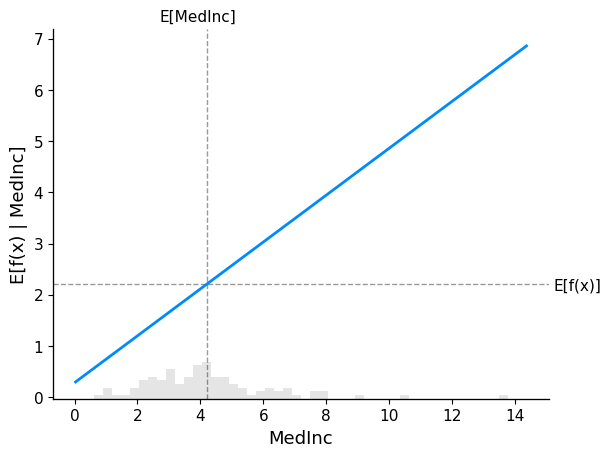

In [4]:
shap.partial_dependence_plot(
    ind = 'MedInc',
    model = model.predict,
    data = x_100,
    ice = False,
    model_expected_value = True,
    feature_expected_value = True
)

The dotted lines represent the expected values for both the facet used in the analysis and the target variable. The *blue partial dependence plot line* (which is the average value of the model output when we fix the median income feature to a given value) always passes through the intersection of the two dotted lines. We can consider this intersection point as the "center" of the partial dependence plot with respect to the data distribution.

### Reading SHAP Values form Partial Dependence Plots
The core idea behind SHAP values based explanations of machine learning models is to use fair allocation results from cooperative game theory to allocate credit for a model's output $f(x)$ among input features. Since in game theory a player can join or not join a game, we need a way for a feature to *join* or *not join* a model. The most common way to define what it means for a feature to *join* a model is to say that a feature has *joined a model* when we know the value of that feature, and it has not joined a model when we don't know the value of that feature. To evaluate an existing model $f$ when only a subset $S$ of features are part of the model we integrate out the other features using a conditional expected formulation:

$$E[f(X)|X_s=x_s]$$

or 

$$E[f(x)|do(X_s=x_s)]$$

In the first form we know the values of the features in $S$ because we *observe* them. In the second form we know the values of the features in $S$ because we *set* them. In general, the second form is usually preferable, both because it tells us how the model would behave if we were to intervene and change its inputs, and also because it is much easier to compute. 

SHAP values can be very complicated to compute (they are $NP$-hard in general), but linear models are so simple that we can read SHAP values right off a partial dependence plot. **When we are explaining a prediction $f(x)$, the SHAP value for a specific feature $i$ is just the difference between the expected model output and the partial dependence plot at the feature's value $x_i$:**

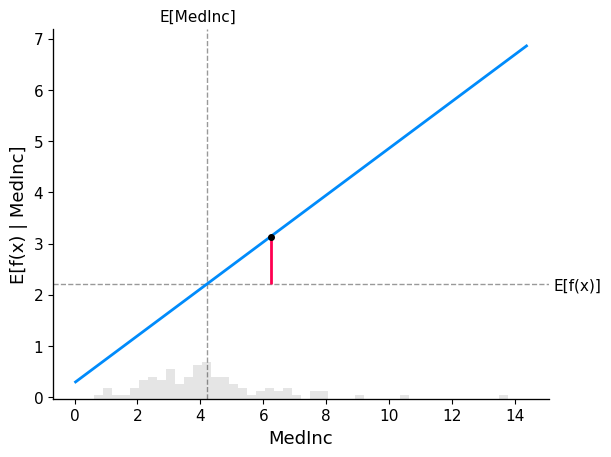

In [5]:
# Compute the SHAP values for the linear model
explainer = shap.Explainer(model.predict, x_100)
shap_values = explainer(x)

# Make a standard partial dependence plot
sample_ind = 20
shap.partial_dependence_plot(
    ind = 'MedInc',
    model = model.predict,
    data = x_100,
    model_expected_value = True,
    feature_expected_value = True,
    ice = False,
    shap_values = shap_values[sample_ind:sample_ind+1, :]
)

The close correspondence between the classic partial dependence plot and SHAP values means that if we plot SHAP value for a specific facet across a whole dataset we will exactly trace out a mean centered version of the partial dependence plot for that feature:

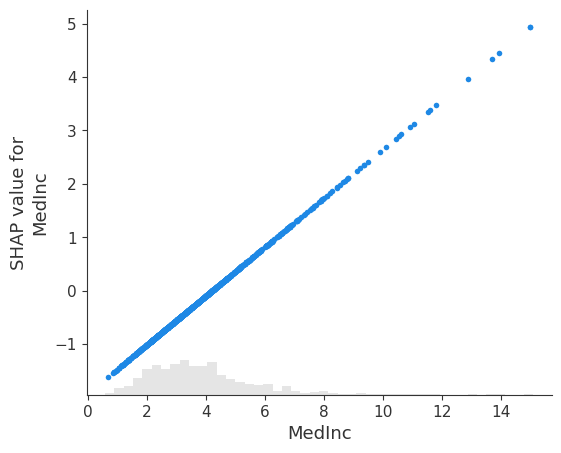

In [5]:
shap.plots.scatter(shap_values[:, 'MedInc'])

### The Additive Nature of SHAP Values
One of the fundamental properties of SHAP values is that they always sum up to the difference between the game outcome when all players are present and the game outcome when no players are present. For machine learning models this means that SHAP values of all the input features will always sum up to the difference between baseline (expected) model output and the current model output for the prediction being explained

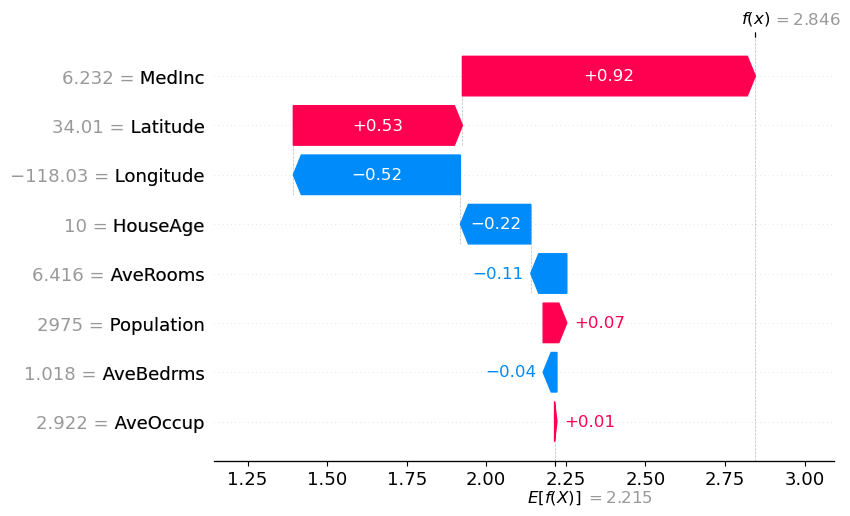

In [6]:
# Waterfall plot
shap.plots.waterfall(shap_values[sample_ind], max_display=20)

### Explaining a non-additive boosted tree model

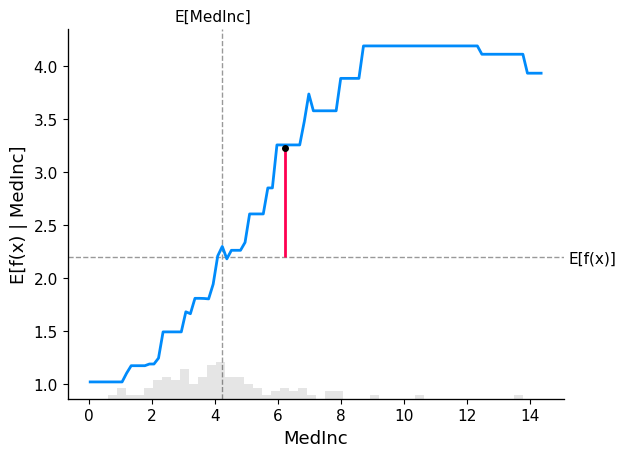

In [9]:
# Generate and train a XGBoost model
import xgboost
model = xgboost.XGBRegressor(n_estimators=100, max_depth=2).fit(x, y)

# Exmplain the model with SHAP
explainer = shap.Explainer(model, x_100)
shap_values = explainer(x)

# Make a standard partial dependence plot
fig, ax = shap.partial_dependence_plot(
    ind = 'MedInc', 
    model = model.predict,
    data = x_100,
    model_expected_value = True,
    feature_expected_value = True,
    show = False,
    ice = False,
    shap_values = shap_values[sample_ind:sample_ind+1, :]
)

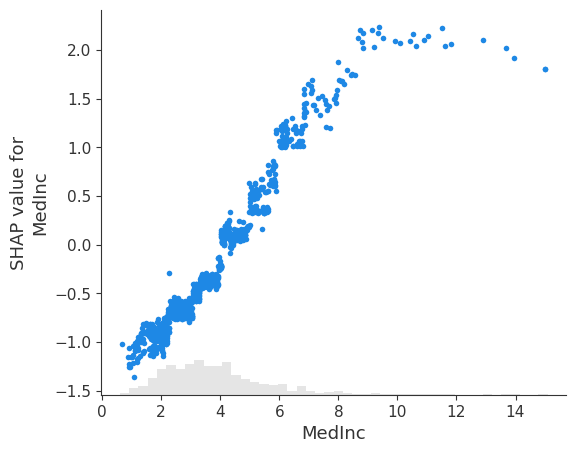

In [11]:
shap.plots.scatter(shap_values[:, 'MedInc'])

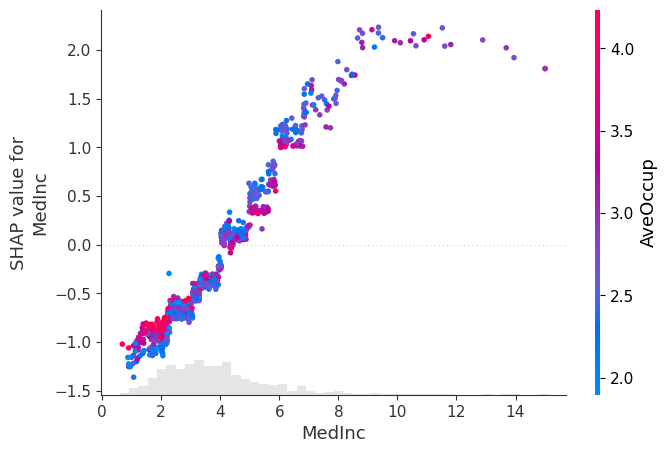

In [13]:
shap.plots.scatter(shap_values[:,"MedInc"], color=shap_values)

### Explaining Classifiers

 97%|=================== | 31603/32561 [00:13<00:00]       

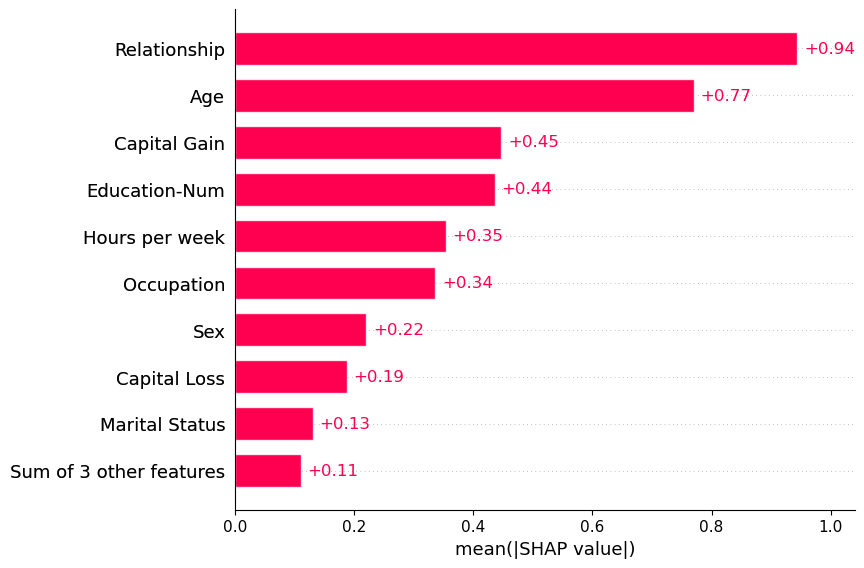

In [29]:
# Extract the adult census dataset 
x, y = shap.datasets.adult()

# Train XGBoost classifier model
model = xgboost.XGBClassifier(
    n_estimators = 100, 
    max_depth = 2, 
    eval_metric = 'logloss'
)
model = model.fit(x, y.astype(int))

# Compute SHAP values
background_adult = shap.maskers.Independent(x, max_samples=100)
explainer = shap.Explainer(model, background_adult)
shap_values = explainer(x)

# Set a display version of the data to use for plotting
shap_values.display_data = shap.datasets.adult(display=True)[0].values

# Plot
shap.plots.bar(shap_values)

**A way  to create a global measure of feature importance with SHAP is to compute the mean absolute value for all instances per facet**. Another way to create a global measure is to use the max absolute value:

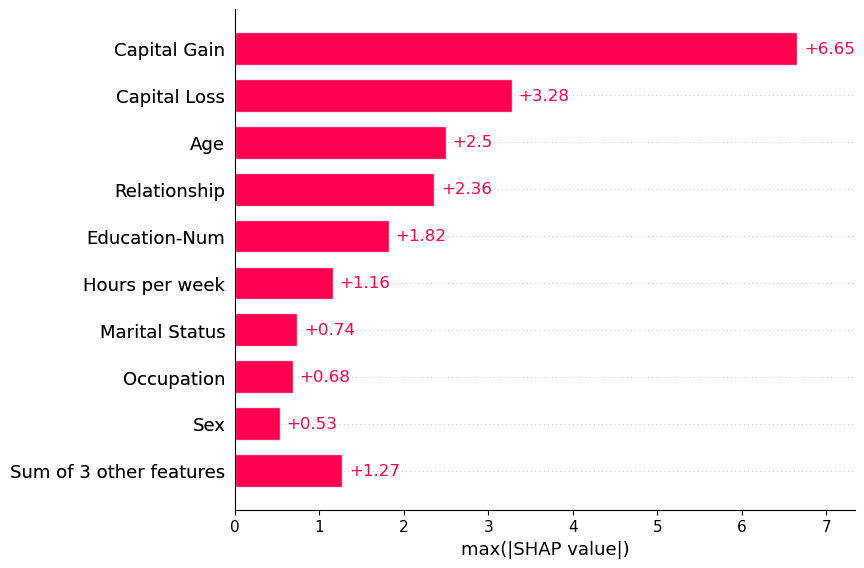

In [30]:
shap.plots.bar(shap_values.abs.max(0))

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


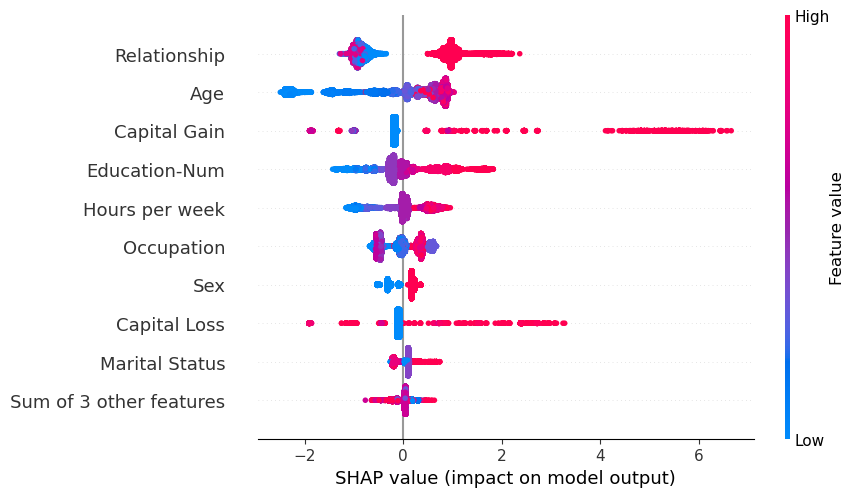

In [31]:
shap.plots.beeswarm(shap_values)

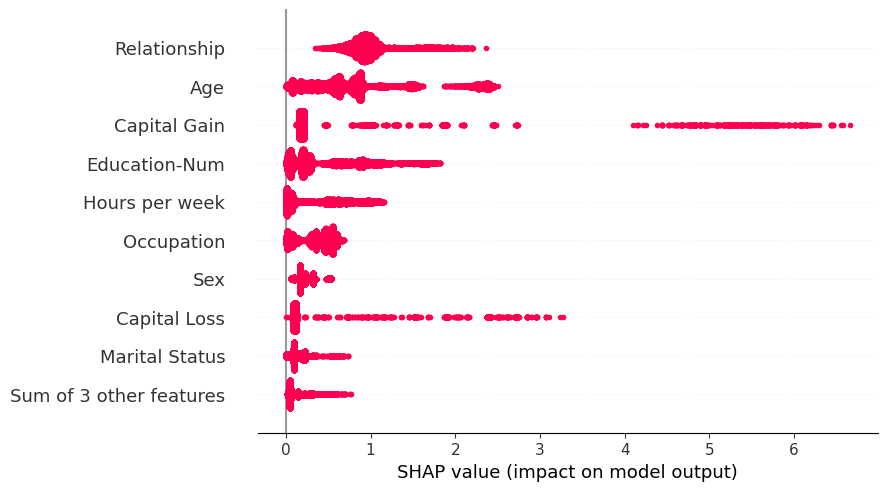

In [32]:
shap.plots.beeswarm(shap_values.abs, color="shap_red")

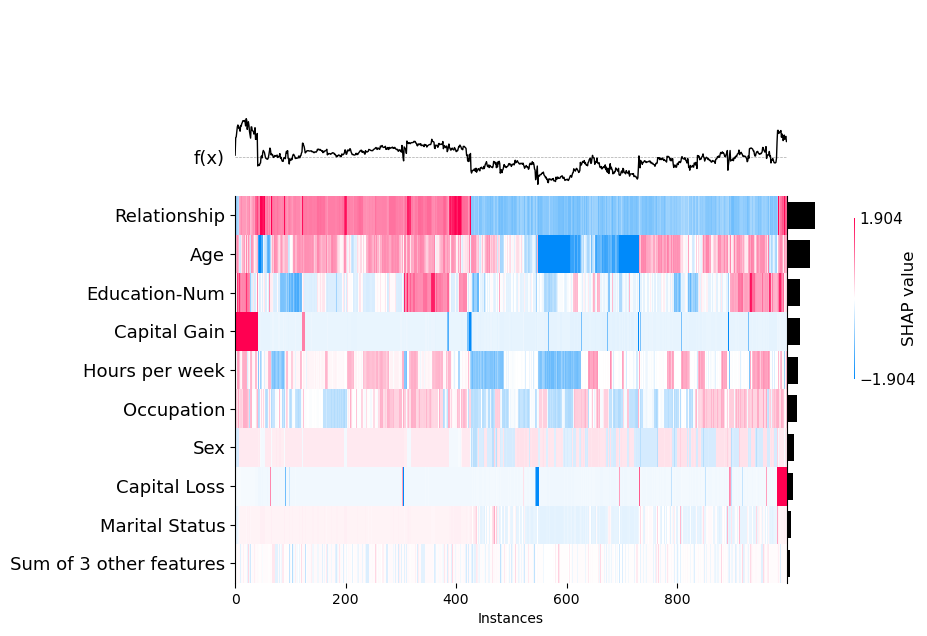

In [33]:
shap.plots.heatmap(shap_values[:1000])

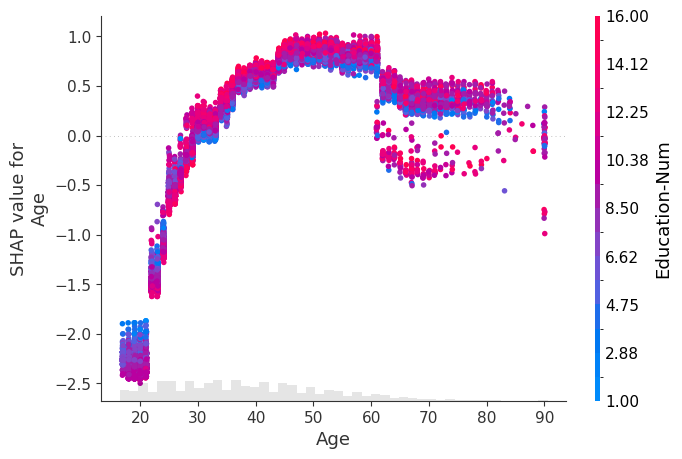

In [34]:
shap.plots.scatter(shap_values[:,"Age"], color=shap_values)

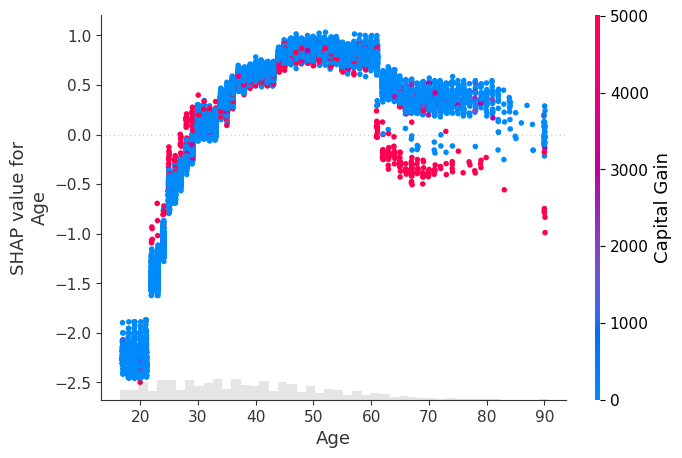

In [36]:
shap.plots.scatter(shap_values[:,"Age"], color=shap_values[:,"Capital Gain"])

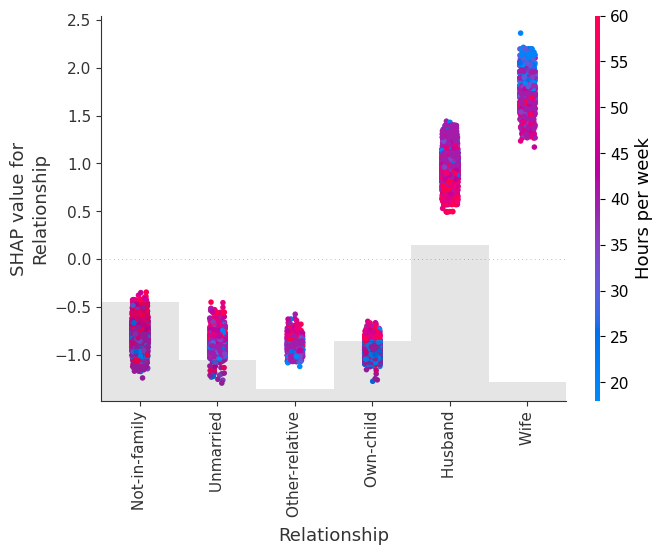

In [35]:
shap.plots.scatter(shap_values[:,"Relationship"], color=shap_values)

***

## [Measure Pretraining Bias](https://docs.aws.amazon.com/sagemaker/latest/dg/clarify-measure-data-bias.html)
Each measure of bias corresponds to a different notion of fairness. The presence of bias can result in different accuracy rates between facets. You need to choose bias metrics that are conceptually appropriate for the application and the situation.

We first need to define some notation, using binary classification as our example case. In the binary classification case, positive and negative labels are assigned to outcomes recorded in a raw dataset for a favored facet *a* and for a disfavored facet *d*. These labels $y$ are referred as *observed labels* to distinguish them from the *predicted labels* $y'$ that are assigned by a machine learning model during the training or inferences stages of the ML lifecycle. These labels are used to define probability distribution $P_a(y)$ and $P_d(y)$ for their respective outcomes.

**Labels**
+ $y$ represents the $n$ observed labels for event outcomes in a training dataset
+ $y'$ represents the predicted labels for the $n$ observed labels in the dataset by a trained model.

**Outcomes**
+ $n^{(1)}$ is the number of observed labels for positive outcomes (acceptances)
+ $n'^{(1)}$ is the number of predicted labels for positive outcomes
+ $n^{(0)}$ is the number of observed labels for negative outcomes (rejections)
+ $n'^{(0)}$ is the number of predicted labels for negative outcomes

**Facet Values**
+ $n_a$ is the number of observed labels for the favored facet value $n_a = n_a^{(1)}+n_a^{(0)}$ the sum of the positive and negative observed labels for the value facet $a$
+ $n_a'$ is the number of predicted labels for the favored facet value: $n_a'=n_a'^{(1)}+n_a'^{(0)}$ the sum of the positive an negative predicted outcome labels for the facet value $a$. Note that $n_a'=n_a$
+ $n_d$ is the number of observed labels for the disfavored facet value
+ $n_d'$ is the number of predicted labels for the disfavored facet value

**Probability distributions for outcomes of the labeled face data outcomes**
+ $P_a(y)$ is the probability distribution of the observed labels for facet $a$. For binary labeled data, this distribution is given by the ratio of the number of samples in facet $a$ labeled with positive outcomes to the total number, $P_a(y^1)=\frac{n_a^{(1)}}{n_a}$, and the ratio of the number of samples with negative outcomes to the total number $P_a(y^0)=\frac{n_a^{(0)}}{n_a}$
+ $P_d(y)$ is the probability distribution of the observed labels for facet $d$. For binary labeled data, this distribution is given by the ratio of the number of samples in facet $d$ labeled with positive outcomes to the total number, $P_d(y^1)=\frac{n_d^{(1)}}{n_d}$, and the ratio of the number of samples with negative outcomes to the total number $P_d(y^0)=\frac{n_d^{(0)}}{n_d}$

To identify bias in the data before expending resources to train models on it, SageMaker Clarify provides data bias metrics that you can compute on raw datasets before training. All of the pretraining metrics are model-agnostic because they do not depend on model outputs and so are valid for any model. The first bias metric examines facet imbalance, but not outcomes. It determines the extent to which the amount of training data is representative across different facets, as desired for the application. The remaining bias metrics compare the distribution of outcome labels in various ways for facets a and d in the data. The metrics that range over negative values can detect negative bias. The following table contains a cheat sheet for quick guidance and links to the pretraining bias metrics.

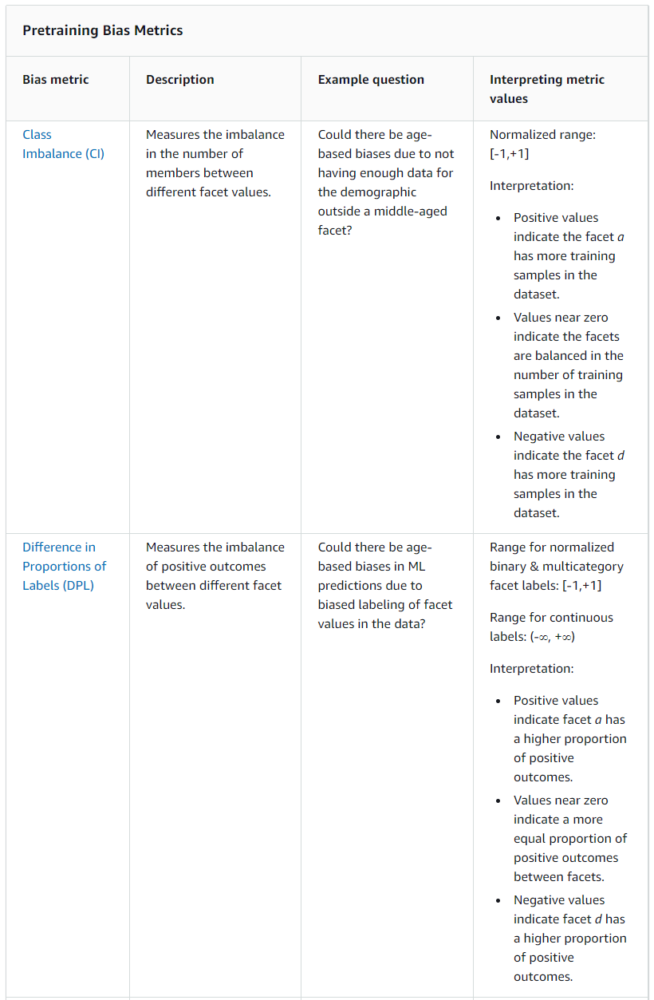

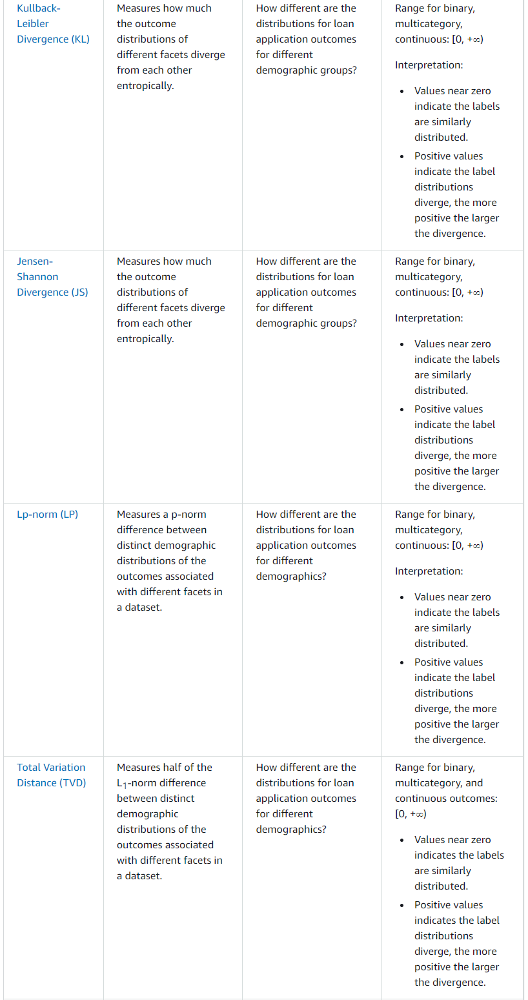

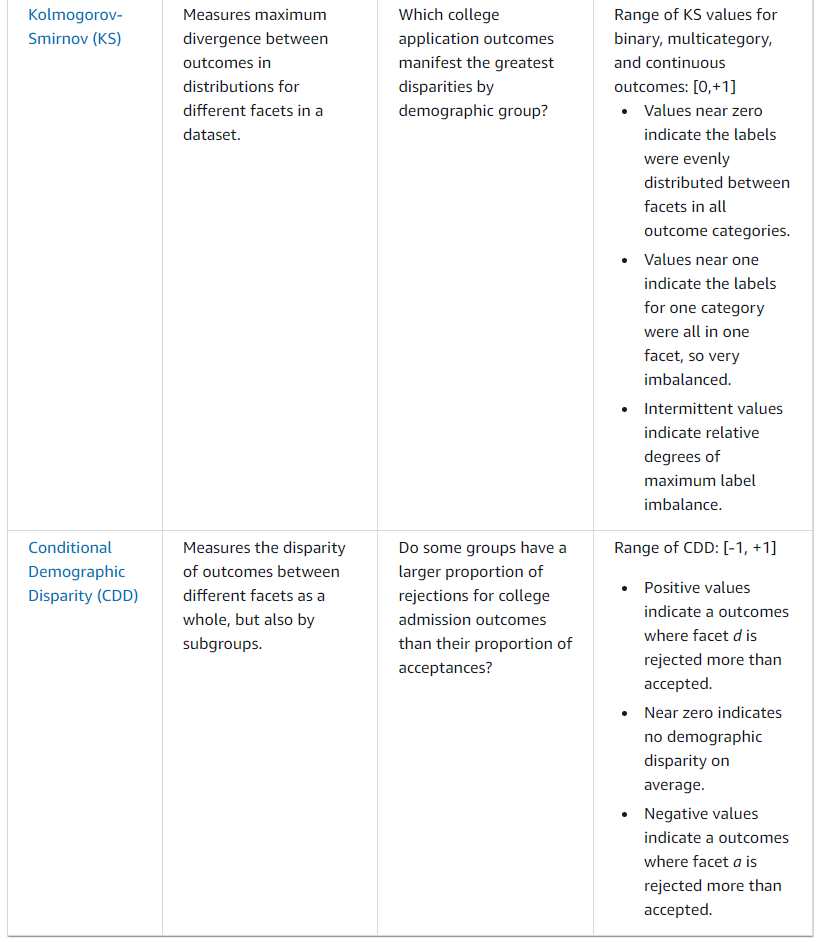

# **Week 3**: *Use Automated Machine Learning to Train a Text Classifier*
***

## Automated Machine Learning (AutoML)
When you are trying to build machine learning models to solve everyday problems, it's common to run into model building challenges. 

1. The steps involved in creating a machine learning model typically involve multiple iterations that can often result in increased time to market.
1. Machine learning can also require specialized skill sets that can be challenging to find or staff, from your existing teams. 
1. Machine learning experiments, or iterations, typically take much longer than traditional development life cycles. This is largely due to the time it takes to get model performance feedback and the time it takes to run through numerous experiments, using different combinations of data transformations, algorithms, and hyper parameters, until you find that model that is performing and meeting at least your minimum objective metric, that you've identified for success.
1. Machine learning development can also make it difficult to iterate quickly, not only from a workflow perspective, but also from a resource perspective. This also includes scarce computing resources. 

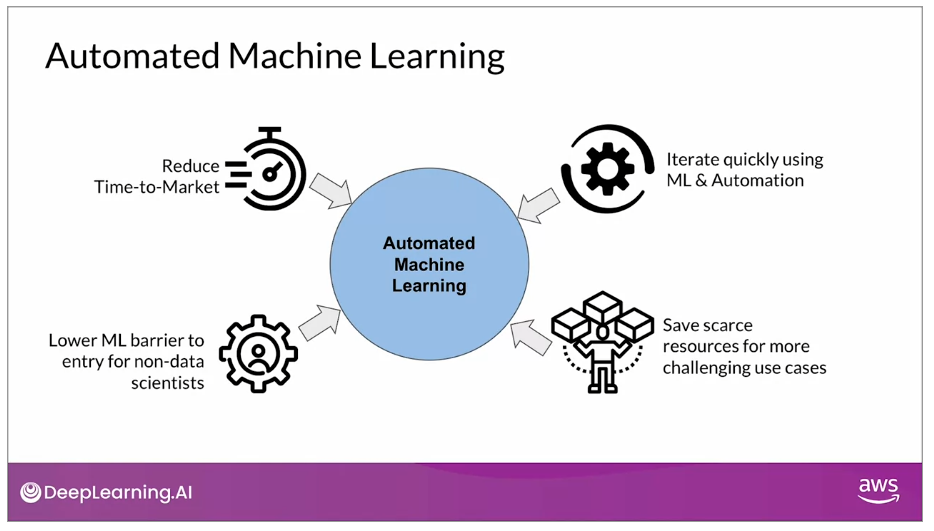

**AutoML** uses machine learning to automate many of the tasks in the machine learning workflow, allowing you to address some of those challenges discussed above. 

1. It can reduce time to market by automating resource-intensive tasks like data transformation, feature engineering, and model tuning. 
1. AutoML can enable your non-data scientists to build machine learning models, without requiring a very deep data science skill set.
1. AutoML lets your iterate quickly, bu using machine learning and automation, to perform the majority of the tasks in your model building workflows. 
1. Using AutoML in combination with cloud computing also addresses potential compute resource challenges, due to capacity constraints which can also cause those longer iterations, because you can't train or tune your models in parallel. 
1. AutoML lets data scientists focus on those really hard-to-solve machine learning problems.

## AutoML Workflow

### *Ingest and Analyze*
In your first step of the machine learning workflow, **ingest and analyze**, you need to understand the problem at hand by ingesting and analyzing the data. Here you collect statistics (*e.g.* missing values, quantiles, skewness, correlation with the target variable) in order to understand the data. In this first step you also identify which type of problem you are facing (classification vs regression), and select potential algorithms that you want to try as part of your training experiments.

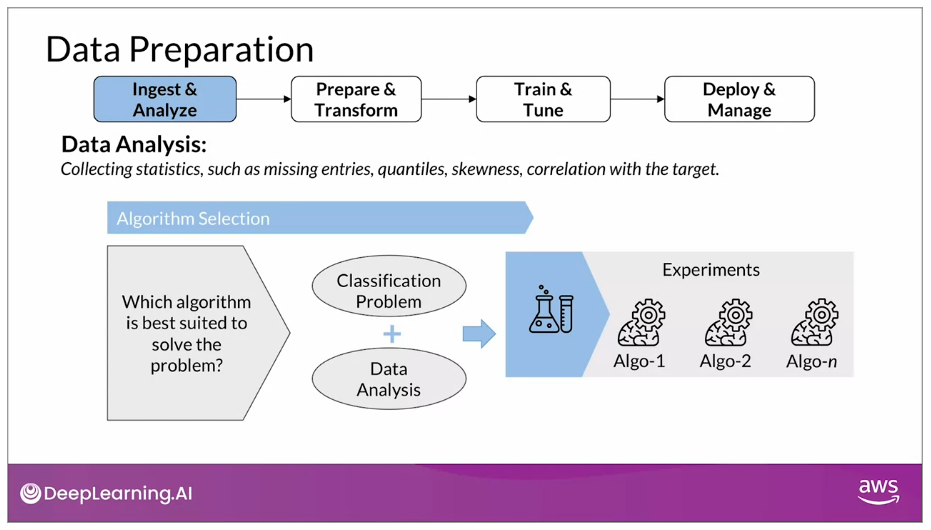

### *Prepare and Transform*
In the next step in the workflow, **prepare and transform**, you prepare the format of your data so that it can be used in the ML algorithms with which you will experiment. You also look for statistical bias (*e.g.* class imbalance) using statistical bias detection techniques, as we saw in the previous week. Once you have done your data transformations, your can then use your processed data to create your training and validation datasets. For this, you reserve the largest portion of your data for training your model. This is the data that the model learns from, and you can use it to calculate model metrics, such as training accuracy and training loss. The validation dataset is used to evaluate your model performance, usually after each epoch or full pass through the training dataset. The purpose of this evaluation is to fine tune the model hyper parameters and determine how well your model is able to generalize on unseen data. With it you can calculate metrics such as validation accuracy and validation loss. 

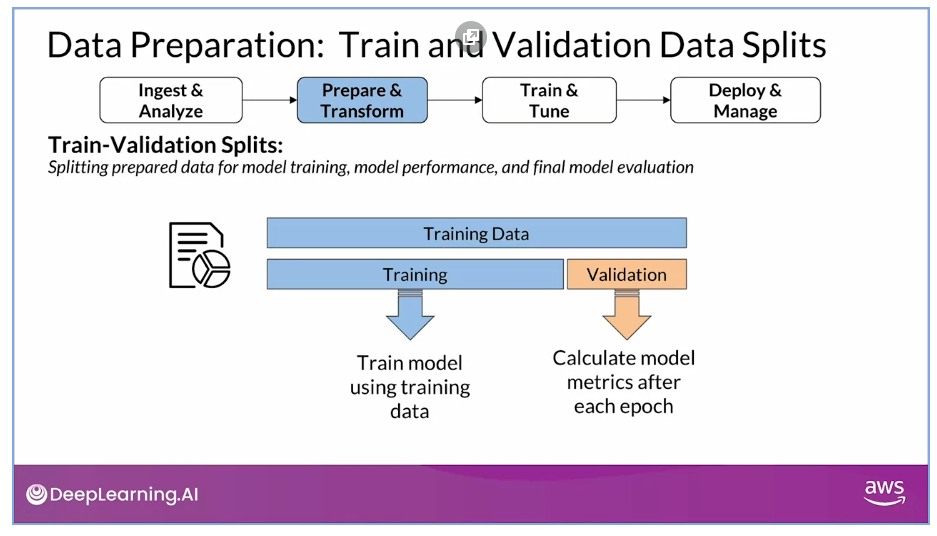

### *Training and Tuning*
Next you move to model **training and tuning**. Model training and validation is highly iterative and typically happens over many experiments. During this step, your goal is to determine which combination of data, algorithm, hyper parameters, result in the best performing model. For each combination that you choose, you need to train the model and evaluate it against the holdout dataset. All these iterations can take a lot of compute, and you typically want to be able to rapidly iterate without running into bottlenecks; so this is where training at scale comes in. 

The cloud gives you access to on-demand resources, that allow you to train an experiment at scale, without wait time or scheduling training time on on-premises resources, that are often constrained or limited by GPU, CPU, or storage. Each combination of data, algorithm, and hyper parameters con consume many human hours and compute hours before getting to a model that is performing well. 

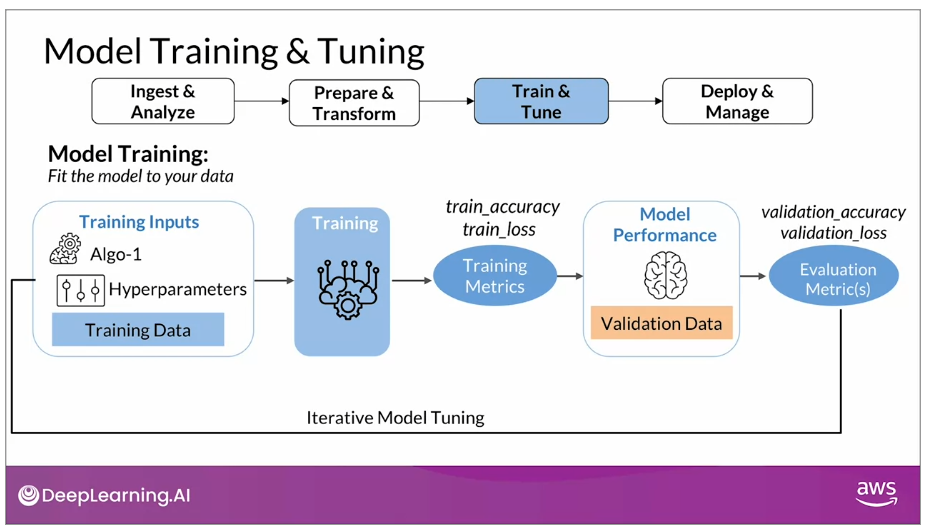

This is where AutoML comes in. In general, AutoML allows you to reduce the need for data scientists to build machine learning models, because it uses machine learning to automate the machine learning workflow tasks. With AutoML you first provide your labeled dataset, which includes the target that you're trying to predict. Then AutoML is going to automatically do some analysis of that data and determine the type of machine learning problem. AutoML will the typically explore a number of algorithms and automatically select the algorithm that best suits your ML problem and your data. 

Once AutoML selects an algorithm, it will automatically explore various data transformations that are likely to have an impact on the overall performance of your model. And then, it will automate the creation of those scripts that will be necessary to perform those data transformations across your tuning experiments. Finally, AutoML will select a number of hyper parameter configurations, to explore over those training iterations, to determine which combinations of hyper parameters and feature transformation code results in the best-performing model. 

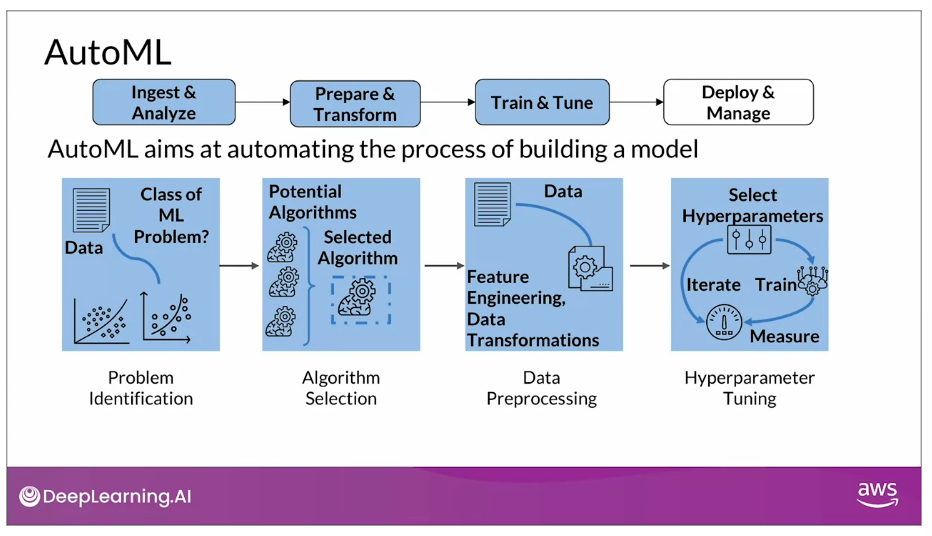

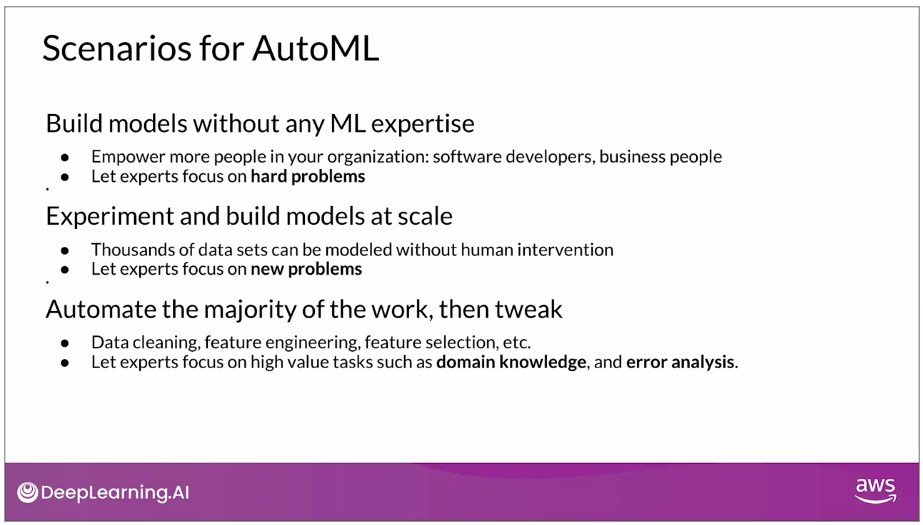

## [Amazon SageMaker Autopilot](https://aws.amazon.com/sagemaker/autopilot/?sagemaker-data-wrangler-whats-new.sort-by=item.additionalFields.postDateTime&sagemaker-data-wrangler-whats-new.sort-order=desc)
**Autopilot** is the Amazon SageMaker implementation of AutoML. It performs data exploration, identifies the machine learning problem, selects the algorithm based on the machine learning problem and the data, transforms the data to get it into the format that is expected by your algorithm, and finally, trains and performs hyper parameter tuning to find the optimal set of hyperparameters that result in the most performant model. 

Autopilot is also fully transparent, meaning it will automatically generate and share the feature engineering code, generate Jupyter Notebooks that walk you through how the models were built (including the data processing, as well as the algorithms, the hyper parameters, and the training configuration). You can then use those automatically generated notebooks to reproduce the same experiment or perform modifications to that example to continue to refine your model. 

To use Autopilot you need to upload your tabular dataset to a S3 bucket. This dataset must contain your target attribute. You tell Autopilot what the target attribute is when creating your Autopilot experiment. Autopilot will then analyze your data, identify the machine learning problem, if you didn't predefine it, and then choose the ML algorithm that most closely matches the input data and the target that you're trying to predict.

**Autopilot** support several built-in algorithms that include *linear learning*, *XGBoost*, and a *deep learning* algorithm. This covers regression, binary classification and multi-class classification.

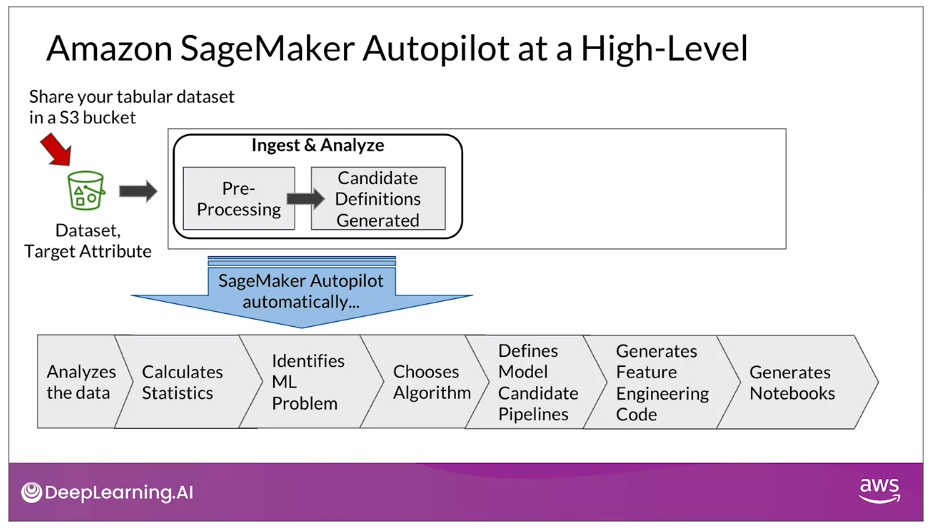

Autopilot will then generate feature engineering code to transform your data into the format that's expected by the algorithm After the data analysis step, Autopilot will generate two types of notebooks that describe the plan that it follows to create the candidate models. First, there's a **data exploration notebook** that describes what Autopilot learned about your data. This notebook also identifies areas of investigation, that may indicate potential issues in your source data that could require further analysis or impact your model performance. The second type of notebook is a **candidate generation notebook**, which contains each suggested data pre-processing step, the algorithm, and the hyper parameter ranges that will be used for the tuning job. 

Autopilot can provide models that are more accurate, even when datasets are highly imbalanced, and have as few as 500 data points. You can also direct Autopilot to use the area under the curve (**AUC**), or the area under the receiver operating characteristic curve, as the objective metric, to create even more accurate models for classification problems. 

You can use autopilot in different ways: you can choose to use it completely on autopilot, which will automatically flow through the data transformation, using the generated feature transformation code. You could also choose to run it with different degrees of human intervention as well (*e.g.* you can set Autopilot so that it does not automatically run the feature engineering code in the data analysis step; this is goof if you want to be able to first look at the candidate notebooks and then decide which ones to train and tune).

Autopilot shares a leader board of all the candidate models, including their metrics, with a ranked list of recommendations, to determine the best-performing model. Autopilot also provides a complete visibility into the feature engineering code, the algorithm, and the optimized hyperparameters that were used, which is designed to give your that control and transparency. 

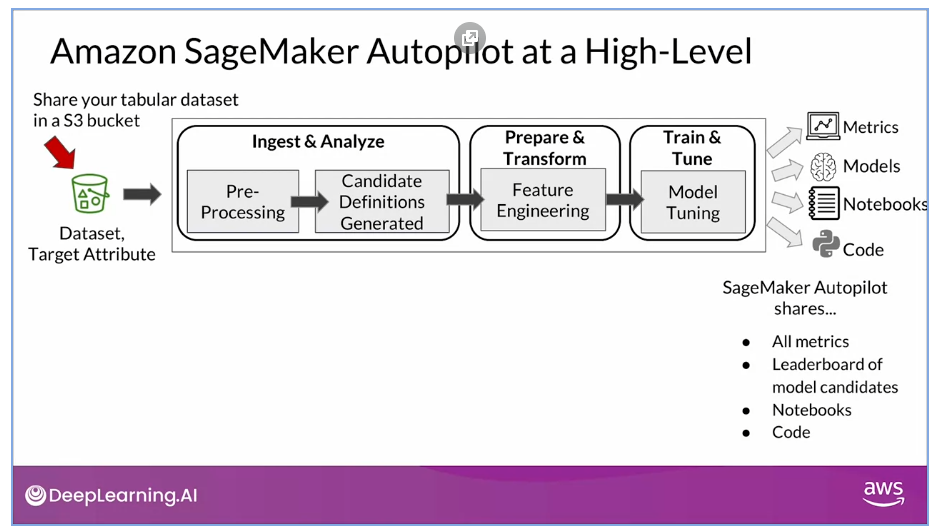

***
### *[A Note on Classification Metrics](https://neptune.ai/blog/f1-score-accuracy-roc-auc-pr-auc)*


#### Accuracy
It measures how many observations, both positive and negative, were correctly classified.

$$Accuracy = \frac{TP+TN}{TP+FP+TN+FN}$$

You **shouldn't use accuracy on imbalanced problems**, because it is easy to get a high accuracy score by simply classifying all observations as the majority class. Since the accuracy score is calculated on the predicted classes (not predicted scores) we **need to apply a certain threshold** before computing it. The most common threshold is 0.5 but it can be suboptimal.

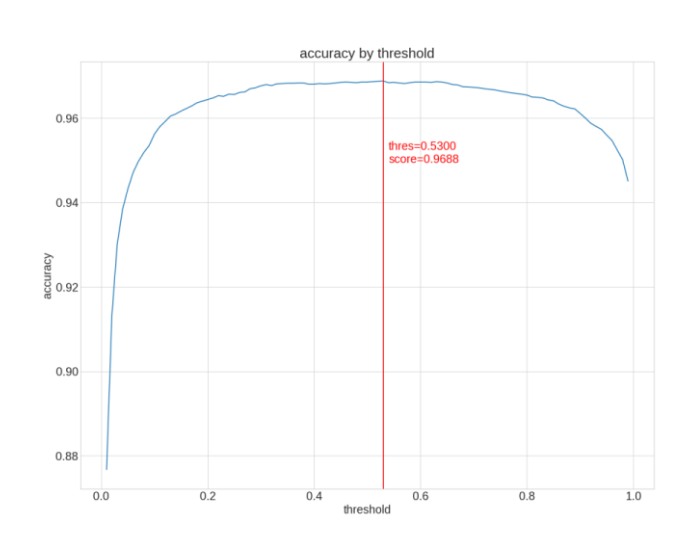

Charts like the one above can be helpful to determine the optimal threshold. It makes sense to use **accuracy** when:

+ Your **problems is balanced** using accuracy is usually a good start. An additional benefit is that it is really easy to explain it to non-technical stakeholders in your project.
+ **Every class is equally important** to you

#### *Confusion Matrix*
The confusion matrix is generated by calculating the number of **true positives** (TU, where the observed class is positive and the model classifies it as positive), **true negative** (TN, where the observed label is negative and the model classifies it as negative), **false positive** (FP, where the observed label is negative but the model classifies it as positive; it is also called a **type 1 error**), and **false negative** (FN, where the observed label is positive but the model classifies it as negative; it is also called a **type 2 error**).

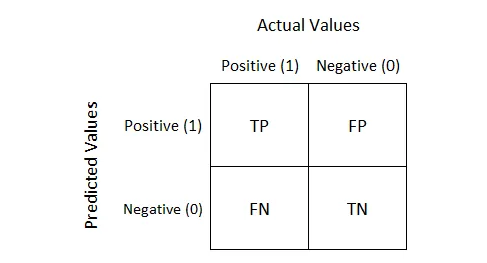

There are different combinations of these metrics that show different insights about the results of the model:

+ **Precision**: it is focused on detecting *false positives*. It is calculated as $precision = \frac{TP}{TP+FP}$
+ **Recall (true positive rate)**: it is focused on detecting *false negatives*. It is calculated as $recall = \frac{TP}{TP+FN}$
+ **False Positive Rate (FPR)**: $FPR = \frac{FP}{TN+FP}$
+ **False Negative Rate (FNR)**: $FNR = \frac{FN}{TP+FN}$
+ **True Negative Rate (TNR)**: $TNR = \frac{TN}{TN+FP}$

**It is important to remember that these metrics are calculated on the predicted classes (not predicted scores), meaning that they are threshold dependent**.

#### *F1 Score*
**F1 score** combines **precision** and **recall** into one metric by calculating the harmonic mean between those two.

$$F1-score = 2*\frac{precision * recall}{precision + recall}$$

It is actually a **special case** of the more general function **F beta**:

$$F_{beta}  = (1+\beta^2)*\frac{precision * recall}{\beta^2 * precision + recall}$$

When choosing $\beta$ in your F-beta score **the more you care about recall** over precision **the higher beta** you should choose. For example, with $F_1$ score we care equally about recall and precision, with $F_2$ score, recall is twice as important to us.

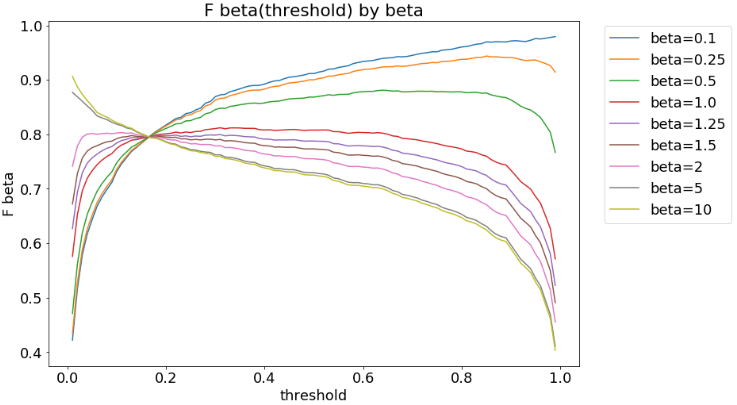

**It is important to remember that F1 score is calculated from *precision* and *recall* which, in turn, are calculated on the predicted classes (not prediction scores)**.

We  can use a plot as the one below to choose the optimal threshold:

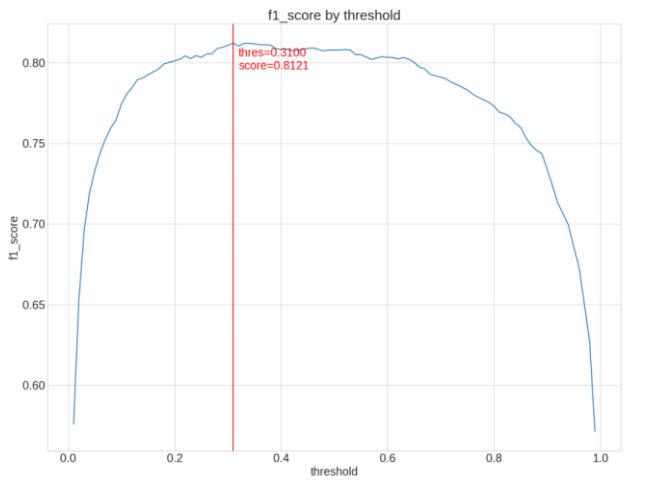

It makes sense to use this metric:

+ Pretty much in every binary classification problem where you care more about the positive class.
+ It **can be easily explained to business stakeholders** which in many cases can be a deciding factor.

#### *ROC AUC*
The **receiver operating characteristic area under the curve** (ROC AUC) is just the are under the TPR vs FPR curve for every threshold. This means that for every threshold we compute the TPR and the FPR and graph the resulting curve, which is called the receiver operating characteristic curve (ROC). We see that there is a trade-off between the TPR and the FPR

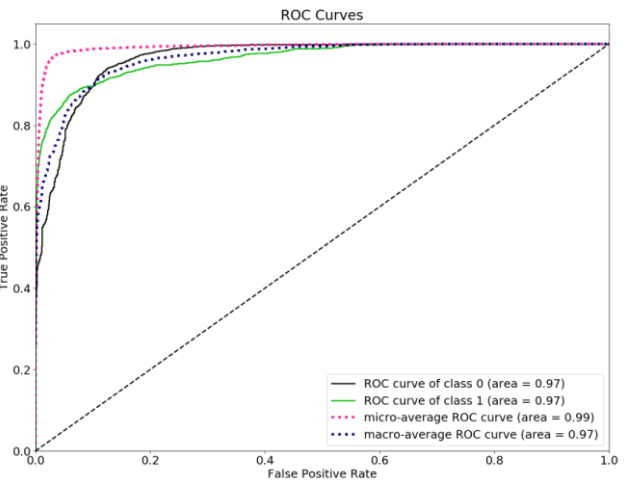

By calculating the AUC of the ROC we can gauge the performance of the model, where we want to achieve a higher ROC AUC (meaning that the curve shown above tilts more towards the left). It can be shown that ROC AUC score is equivalent to calculating the rank correlation between predictions and targets. From an interpretation standpoint, it is more useful because it tells us that this metric show **how good at ranking prediction your model is**. It tells you what is the probability that a randomly chosen positive instance is ranked higher than a randomly chosen negative instance.

+ You **should use it** when you ultimately **care about ranking predictions** and not necessarily about outputting well-calibrated probabilities
+ You **should not use it** when your **data is heavily imbalanced**. The intuition is the following: false positive rate for highly imbalanced datasets is pulled down due to a large number of true negatives
+ You **should use it when you care equally about positive and negative classes**.

#### *PR AUC | Average Precision*
Similarly to ROC AUC, this metric depends on a curve: the *precision-recall curve*. It is a curve that combines **precision vs recall** in a single visualization. For every threshold you calculate both metrics and plot the resulting curve. The higher on y-axis your curve is the better your model performance. 

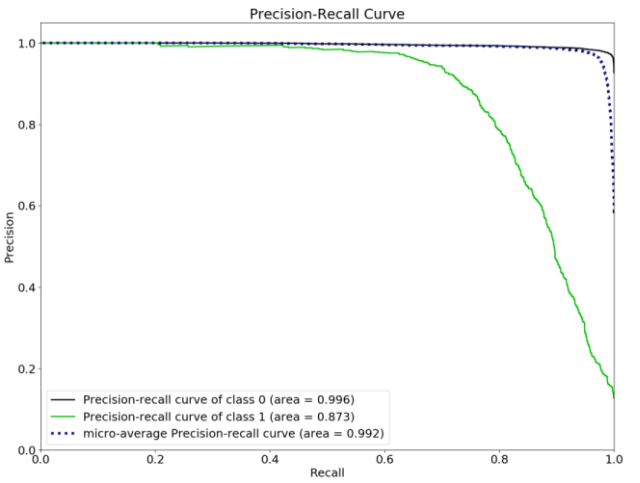

You can use this plot to decide a threshold when it comes to the classic precision/recall dilemma. Knowing **at which recall you precision starts to fall fast** can help you choose the threshold and deliver a better model.

You can also **think of PR AUC as the average of the precision scores calculated for each recall threshold**. 

+ When you cant to **communicate precision/recall decision** to other stakeholders
+ when you want to **choose the threshold that fits the business problem**
+ when your data is **heavily imbalanced**. The intuition is the following: since PR AUC focuses mainly on the positive class it cares less about the frequent negative class.
+ when **you care more about positive than negative class**.

#### Case of Study 

In [73]:
from sklearn.metrics import (
    confusion_matrix, accuracy_score, f1_score, roc_auc_score,
    average_precision_score, recall_score, precision_score
)
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import xgboost as xgb
import lightgbm as lgb

import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [63]:
df = pd.DataFrame(
    columns=[
        'algorithm', 'accuracy', 'recall', 'precision', 'f1-score', 'ROC AUC', 
        'PR AUC', 
        
    ]
)

In [13]:
# Import dataset
x, y = load_breast_cancer(return_X_y=True, as_frame=True)
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.3
)

In [31]:
# XGBoost model
xgb_model = xgb.XGBClassifier()
xgb_model = xgb_model.fit(x_train, y_train)
y_hat_xgb = xgb_model.predict_proba(x_test)[:, 1]

In [32]:
# LightGBM
lgb_model = lgb.LGBMClassifier()
lgb_model = lgb_model.fit(x_train, y_train)
y_hat_lgb = lgb_model.predict_proba(x_test)[:, 1]

In [64]:
def metrics_results(df, model_name, y_obs, y_hat):
    accuracy = accuracy_score(y_obs, y_hat>0.5)
    precision = precision_score(y_obs, y_hat>0.5)
    recall = recall_score(y_obs, y_hat>0.5)
    f1 = f1_score(y_obs, y_hat>0.5)
    roc_auc = roc_auc_score(y_obs, y_hat)
    pr_auc = average_precision_score(y_obs, y_hat)
    df.loc[len(df)+1, :] = [
        model_name, accuracy, recall, precision, f1, roc_auc, pr_auc
    ]

metrics_results(df, 'XGBoost', y_test, y_hat_xgb)
metrics_results(df, 'LightGBM', y_test, y_hat_lgb)
df

,algorithm,accuracy,recall,precision,f1-score,ROC AUC,PR AUC
1,XGBoost,0.97076,0.973451,0.982143,0.977778,0.996186,0.997913
2,LightGBM,0.982456,0.99115,0.982456,0.986784,0.996643,0.998205


In [70]:
def compute_curve(y_obs, y_hat, curve_name):
    thresholds = np.linspace(0, 1, 1000)
    if curve_name == 'pr_auc':
        df = pd.DataFrame(columns=['threshold', 'TPR', 'FPR'])
        for n, i in enumerate(thresholds):
            cm = confusion_matrix(y_obs, y_hat>i)
            tpr = cm[1, 1]/(cm[1, 1] + cm[1, 0])
            fpr = cm[0, 1]/(cm[0, 1] + cm[0, 0])
            df.loc[n, :] = [i, tpr, fpr]
    else:
        df = pd.DataFrame(columns=['threshold', 'precision', 'recall'])
        for n, i in enumerate(thresholds):
            precision = precision_score(y_obs, y_hat>i)
            recall = recall_score(y_obs, y_hat>i)
            df.loc[n, :] = [i, precision, recall]
    return df


In [72]:
xgb_prauc_df = compute_curve(y_test, y_hat_xgb, 'pr_auc')
xgb_rocauc_df = compute_curve(y_test, y_hat_xgb, 'roc_auc')
lgb_prauc_df = compute_curve(y_test, y_hat_lgb, 'pr_auc')
lgb_rocauc_df = compute_curve(y_test, y_hat_lgb, 'roc_auc')

C:\Users\ALEJANDRO\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ALEJANDRO\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


***

### Running Experiments with Amazon SageMaker Autopilot
An **experiment** refers to an Autopilot job. 

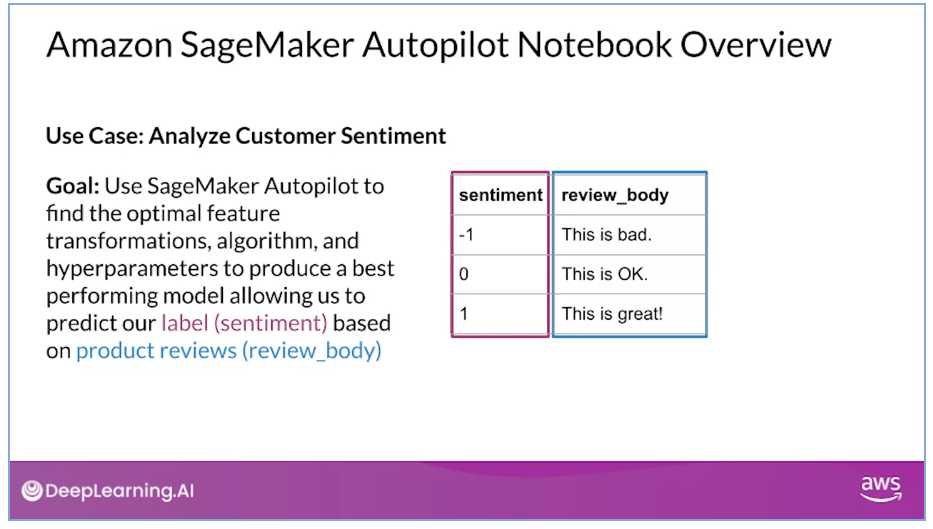

You can interact with Autopilot in multiple ways: i) *programmatically*, going through the SageMaker API and using the AWS Command Line Interface (CLI), the AWS SDKs, or the SageMaker Python SDK; ii) *interface* through SageMaker Studio, which is integrated workbench for end-to-end machine learning workflow activities. 

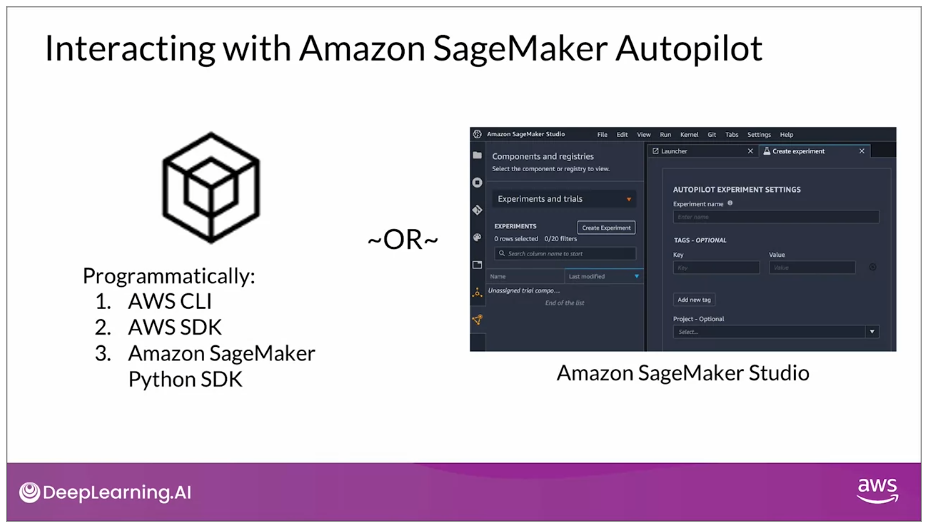

1. **Configure the Autopilot job completion criteria**: define how long a job is allowed to run and how many candidates a job is allowed to produce. Once you have configured the Autopilot completion criteria, you want to also define your input and output data (the S3 bucket location that contains the dataset for the `inputs` parameter, and the S3 bucket for the model's artifacts, including the results notebooks). The `targetattribute_name` is the name of the attribute you want to predict. An additional configuration you could use is `generate_candidate_definitions_only`, which makes Autopilot only generate the data exploration and candidate notebooks, so that you can review or modify them instead of running then in complete autopilot model. 

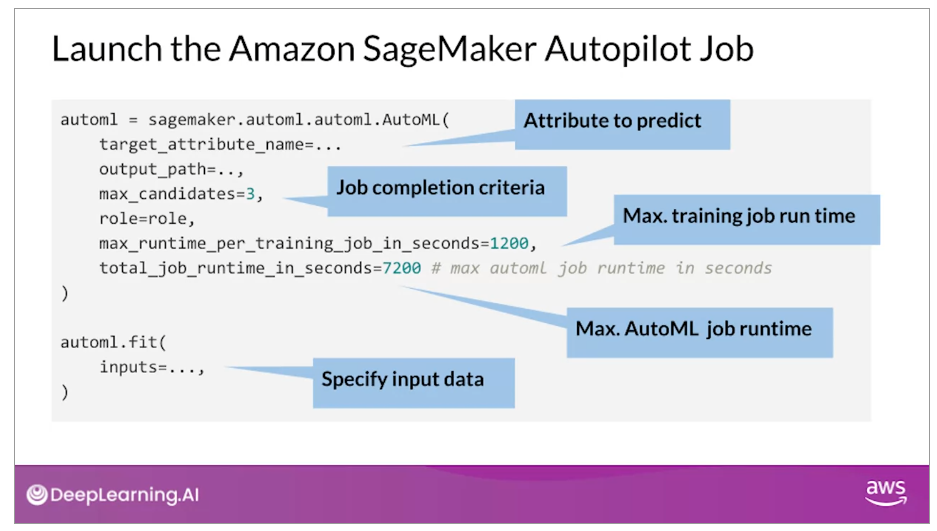

2. **Launch your Autopilot job**: you need to specify a name for your job and refer to the configurations that we have just seen. You will also use a role that is defined in AWS Identity and Access Management (IAM). The role must be set up to allow permissions required for the job to issue the API calls that are needed, to complete the Autopilot tasks.

These same steps could also be performed in a more click-through experience inside Amazon SageMaker Studio. Once your job is submitted, you can then monitor the progress of your job, either through `DescribeAutoMLJob` API call, or through your Studio environment.

#### Generated Code for Feature Engineering
**SageMaker Autopilot** automatically performs data exploration and prepared the data for the problem type. For a text processing task, there are several different ways to perform feature engineering and transformations. Autopilot uses a Python module that is an extension built int on top of Scikit-Learn. In the case of text data it would be `MultiColumnTfidfVectorizer`, which converts collections of raw documents to a matrxi of Term Frequency Inverse Document Frequency, or TFIDF features.

At a high level you are evaluating how relevant a word is in a text corpus. This is done by calculating how often the words appear and the inverse document frequency of those words across a set of documents. 

A typical approach is to pull all text in a bag and then sample from it without replacement. This way you can tally how many times a given word appears and produce a vector of counts. This approach is called **Bag-of-Words**. Once you produce a vector using BoW you want to quantify how important a word is to a document, relative to others in the corpus. Here you're trying to compute a concise and reliable statistical description of a word's weight. 

**The TF is the relative frequency of a word in a document, against all other words in that specific document**. It is the ratio of the word frequency in a document, over the sum of the frequencies of all words in that specific document.

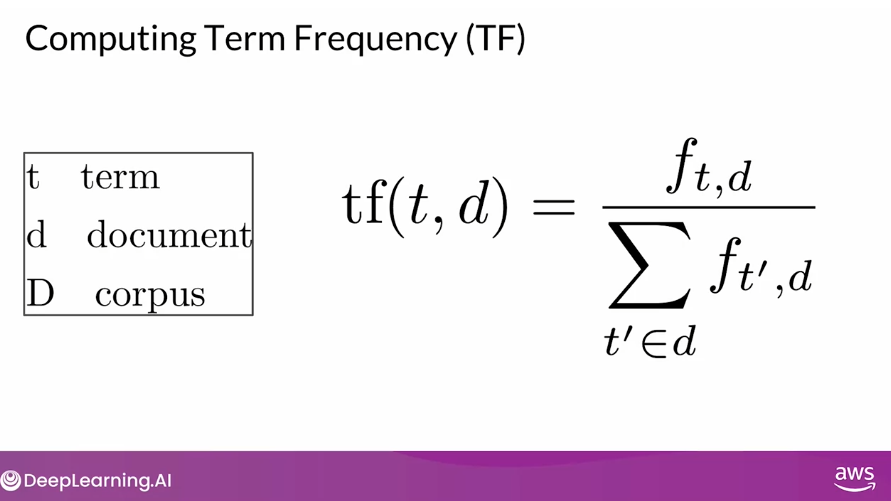

**The IDF (inverse document frequency) measures how important a term is by looking at the whole corpus**. The numerator $|D|$ is the total number of documents in a corpus, and the denominator $\{d\in D: t\in d\}$ tallies all the instances of the instances of the term in the corpus. This will result in the weight of common but not important words (such as preposition or connectors) being scales down, while scaling up the weight of rare terms.

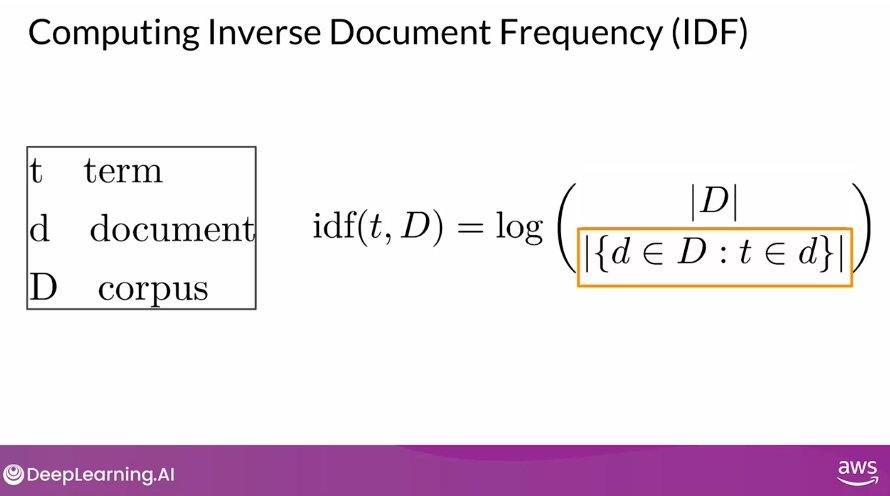

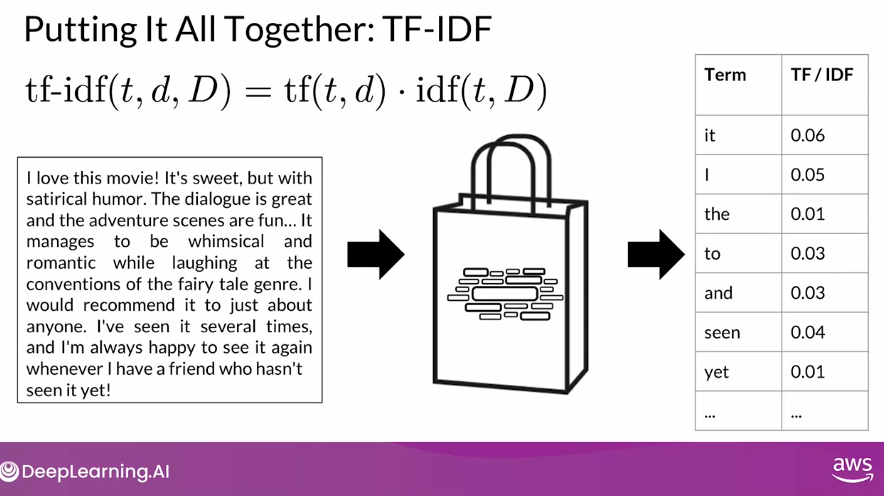

## Amazon SageMaker Autopilot: Evaluating Output
After your Autopilot job is completed there are several resources and artifacts that are automatically generated. 

1. Data transformation code. 
2. Data exploration and candidate generation notebooks $\rightarrow$ data exploration activities performed to analyze your data; steps for each candidate model (pre-processors, algorithm, hyper parameter settings selected by Autopilot). These artifacts provide visibility into each candidate and can be used to perform any additional refinements of our model. These artifacts are stored in the defined S3 bucket when configuring the Autopilot job. 
3. Training and validation datasets (that result from the data transformation code).
4. Model experiments with different combinations of data transformation code, algorithm and hyperparameter configurations. This is done to identify the best performing candidate model. 
5. Metric leader board, with key metric result for each candidate model. 

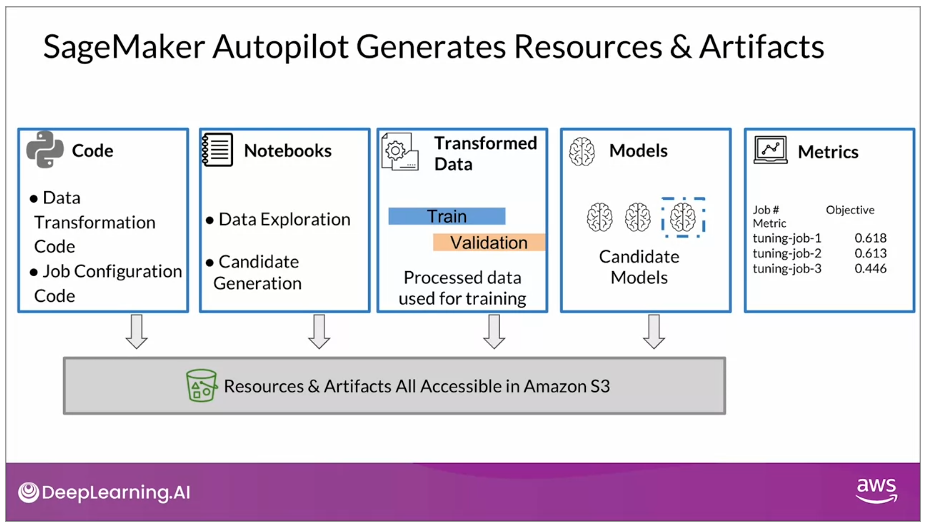

The notebooks are accessible in S3, but you can also access the notebooks from the Studio console as well.

In summary, Autopilot generate **model candidate pipelines**, which are composed of:

+ the feature engineering code (`dpp0.py`)
+ the algorithm and the algorithm hyperparameter ranges

For each of the pipelines that are generated, multiple hyper-parameter tuning jobs will be done to find the algorithm hyperparameters that perform best within that candidate pipeline. 

## Model Hosting
Once you have found your best-performing model you must deploy it to consumption. You can deploy it either for real-time use or for batch use. In the real-time case you need the model to be persistently available to be able to serve real-time requests for prediction. Serving your predictions in real time requires a model serving stack, that not only has your trained model, but also a hosting stack, to be able to serve those predictions. Your model can be consumed by client applications through real time, invoke endpoint API requests.

With SageMaker model hosting, you simply choose the instance type, as well as the count, combined with the doc or container image that you want to use for inference, and then SageMaker takes care of creating the endpoint and deploying that model to the endpoint. 

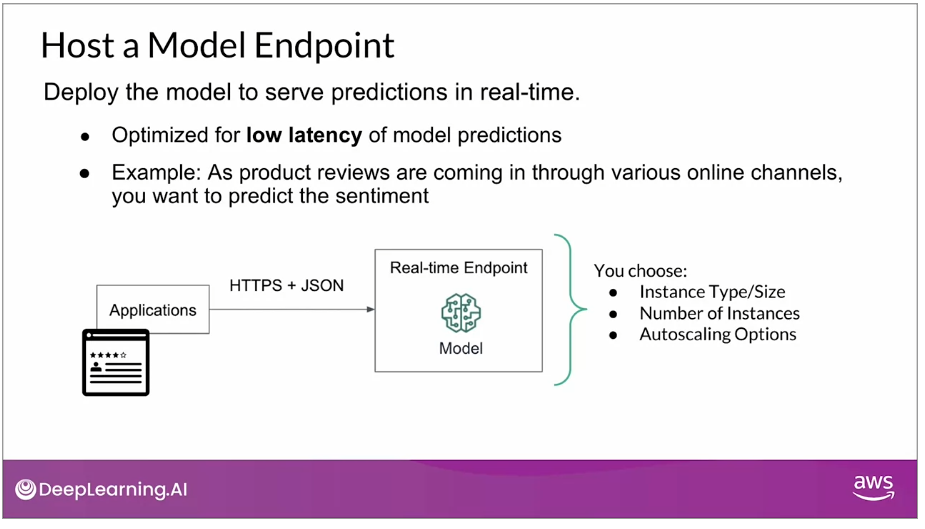

A pipeline model actually has multiple containers that are needed for inference, including:
+ Data transformation container: this container performs the same transformation on your dataset that were used for training, you that you can ensure your prediction request data is in the correct format for inference.
+ Algorithm container: this container has the trained model artifact that was selected as the best-performing model, based on your hyper parameter tuning jobs.
+ Inverse label transformer container: this container is used to post-process your prediction into a readable value by your application, that consumes the output.

When you choose to deploy a candidate pipeline generated by Autopilot, it gets deployed using SageMaker hosting feature, called **inference pipeline**. With inference pipeline you are able to host your data transformation model, your product classification model, and your inverse label transformer behind the same endpoint. This allows you to keep your training and inference code in sync and allow you to abstract those transformations away from your consuming applications. 

When an inference request comes in, the request is sent to the first data transformation model, and then, the remaining models are sequentially run with that final model. In this case, the inverse label transformer sending the final influence result back to your client application. 

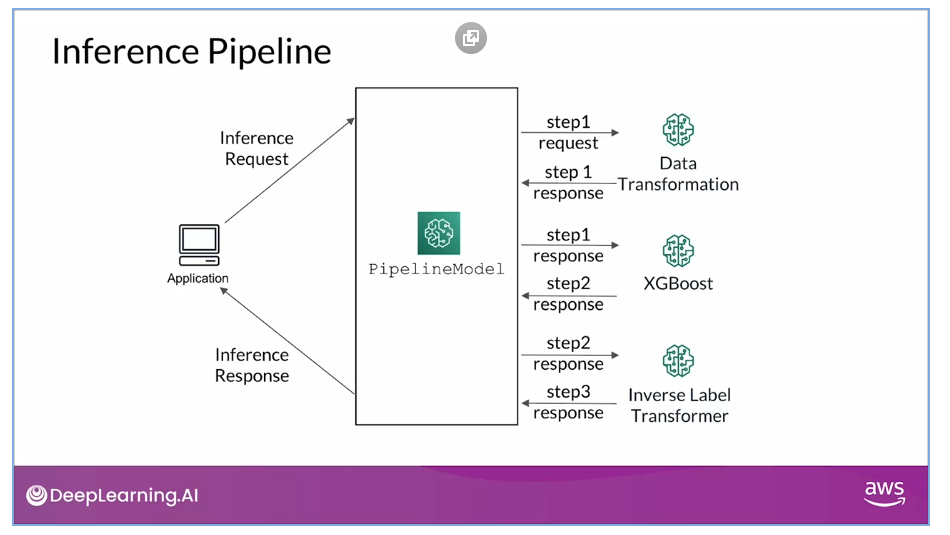

# **Week 4**: *Built-in Algorithms*
***

The big advantage of **built-in algorithms** is that they require no coding: to start running experiments, you can just provide the algorithms with your input data, set any model hyper-parameters, and define the compute resources such as the number and type of compute instances to use. Another benefit is that many of them support GPUs and parallelization across multiple compute instances without any additional configuration. This eases working with a large dataset, and distributing the training process.

## Built-In Algorithms
Built-in algorithms require some data preparation because they expect the input data in a certain format. However there are many reasons to use built-in algorithms:

+ They help you run experiments quickly because your don't need to write any custom model code.
+ Implementations are highly optimized and scalable (many support GPU and distributed training, where switching from CPU to GPU-based compute instances is as simple as updating the relevant computer incidence type, and switching to distributed training si as simple as increasing the instance count to anything larger than one)
+ Focus more on domain-specific tasks rather than managing low-level model code and infrastructure
+ Trained models can be downloaded and re-used elsewhere

When facing a machine learning problem, you should start with the easiest solution: if there is a built-in algorithm available that can solve your task, then use it. **There is no reason to solve problems for simple AI ML tasks that have already been solved**. If there isn't a solution then you can go to a more customized solution. 

In AWS SageMaker this is done by using *Bring Your Own Script* or **script mode**. With it you can use a framework supported by SageMaker such as TensorFlow or Pytorch or MXNet and provide your custom code that is the script in a text file. There you can write your own code for training an algorithm.

The highest degree of customization is to bring your own container. In this approach you configure the training of the algorithm and the serving of the model by your Docker files. Docker is a software for built-in applications based on containers. This approach requires intermediate knowledge of Docker and is not recommended unless your are comfortable writing your own machine learning algorithms.

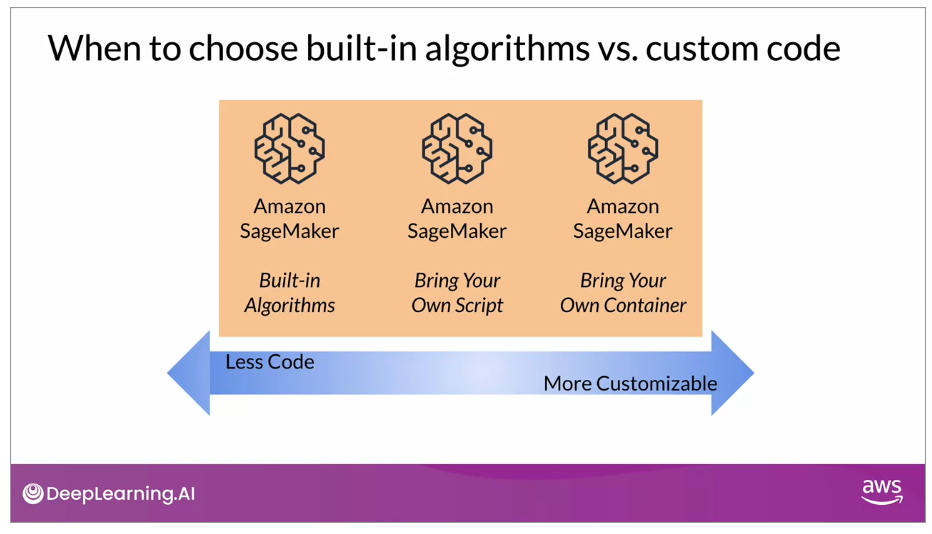

## Use Cases and Algorithms
There are a set of ML tasks and learning paradigms in which the ML problems you will face can be classified:

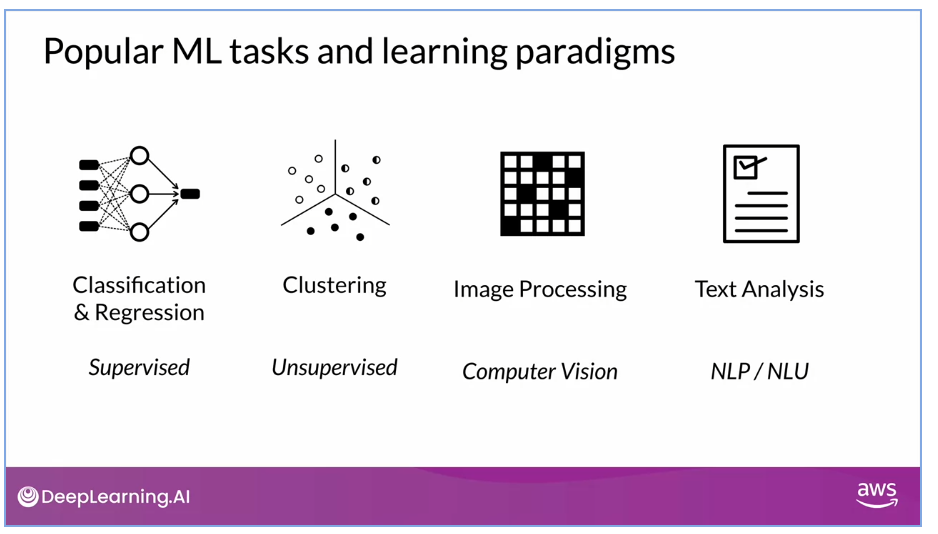

For each of these tasks and learning paradigms we have different built-in algorithms ready for use. 

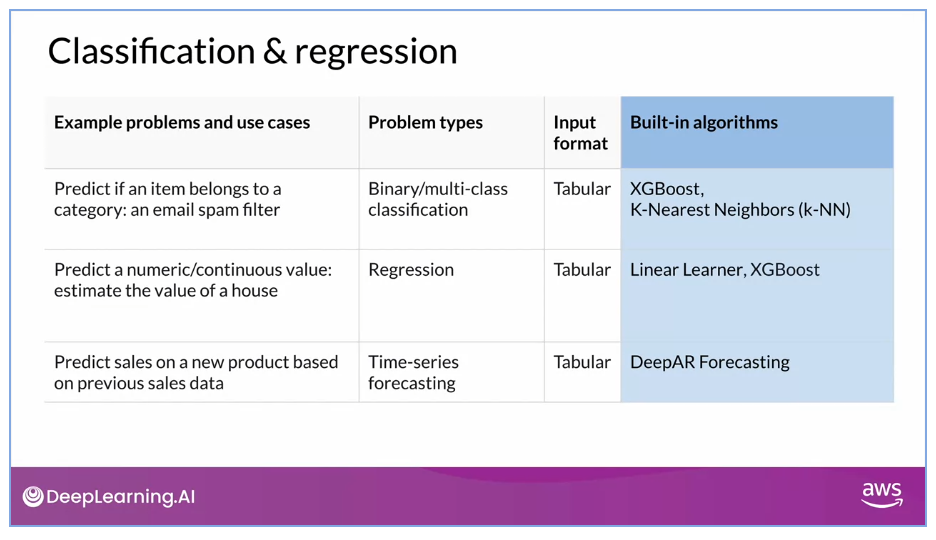

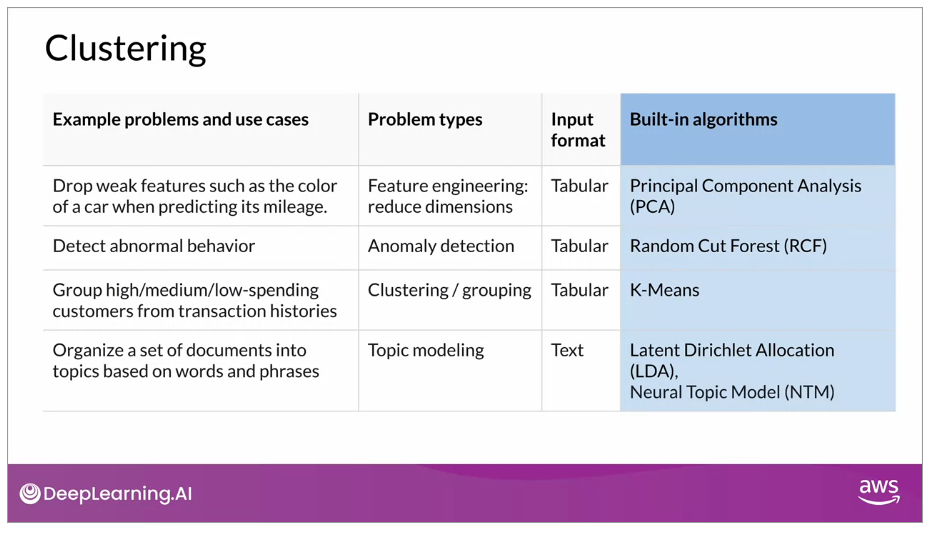

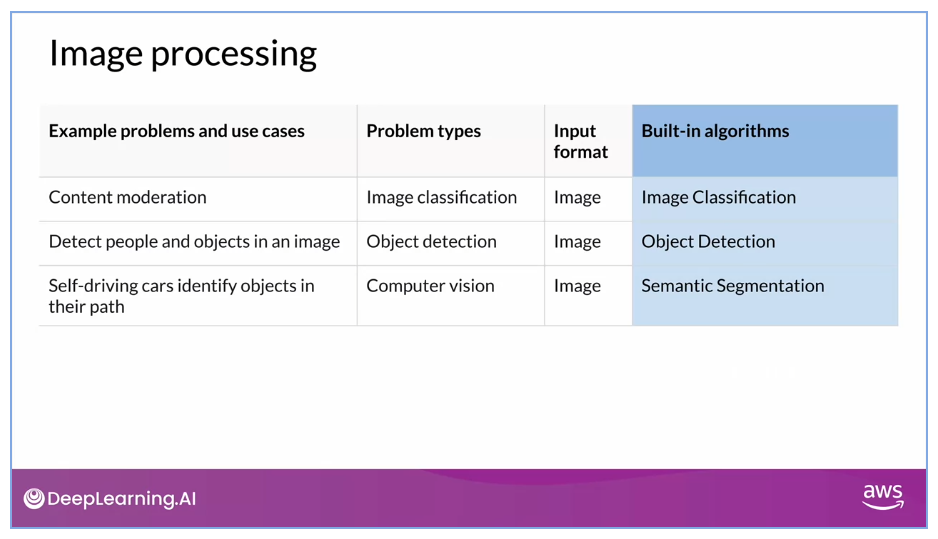

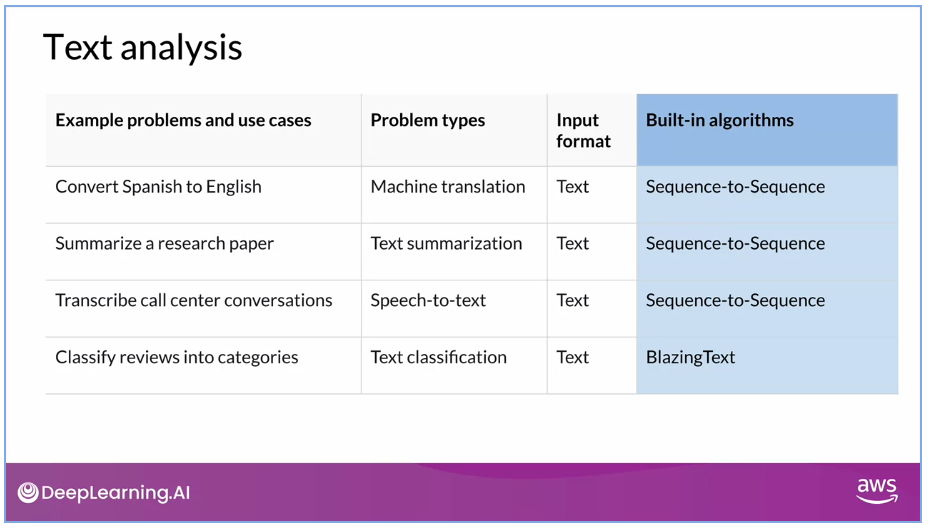

## Text Analysis
**Text analysis or natural language processing (NLP)** as a scientific field has been studied since the 1950s. There has been enormous progress in the filed due to the evolution and the advancement of machine learning algorithms for text analysis. Let's see the more recent advancements:

+ **Word2Vec** (January 2013): this model converts text into vectors, called *embeddings*. Each of those vectors consists of $n$ values. Hence, it represents a $n$-dimensional vector space. You can then use those vector representations as inputs to your machine learning. It is famous for its two model architecture to create the embeddings. The architectures are based upon shallow two layer neural networks. In continuous-bag-of-words (CBOW) predicts the current word from a window of surrounding context words, and continuous skip-gram uses the current word to predict the surrounding window of context words. One challenge of this algorithm is that it tends to run into what is called out of vocabulary issues, because its vocabulary only contains three million words. The vocabulary is a set of known words that the model learned in the training phase, and out of vocabulary words are words that were not present in the text dataset the model was initially trained on, so the word is not found in its vocabulary. 

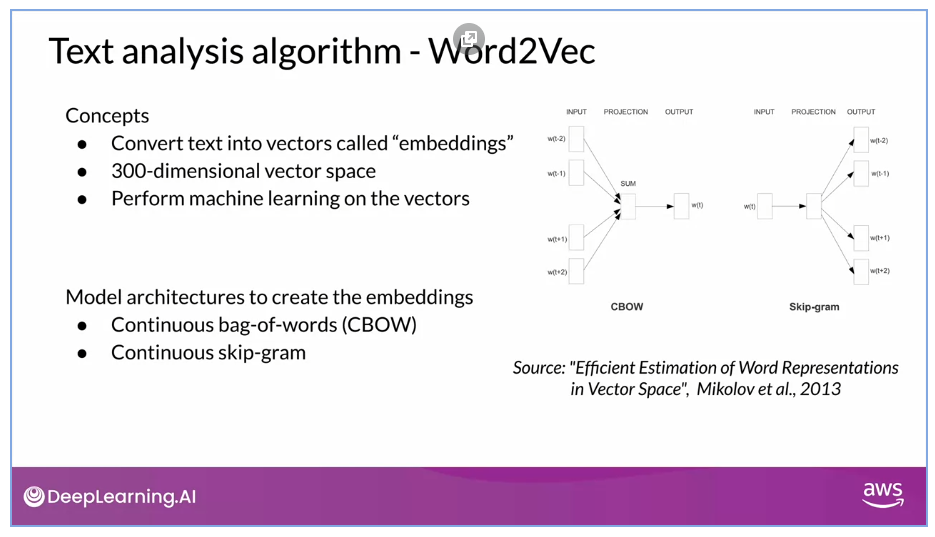

+ **GloVe** (January 2014): it used the regression model to learn word representations through unsupervised learning. 
+ **Fast Text** (July 2016): it builds on Word2Vec, but it treats each word as a set of sub-words called the character $n$-gram. This helps with the out of vocabulary issue mentioned before. 

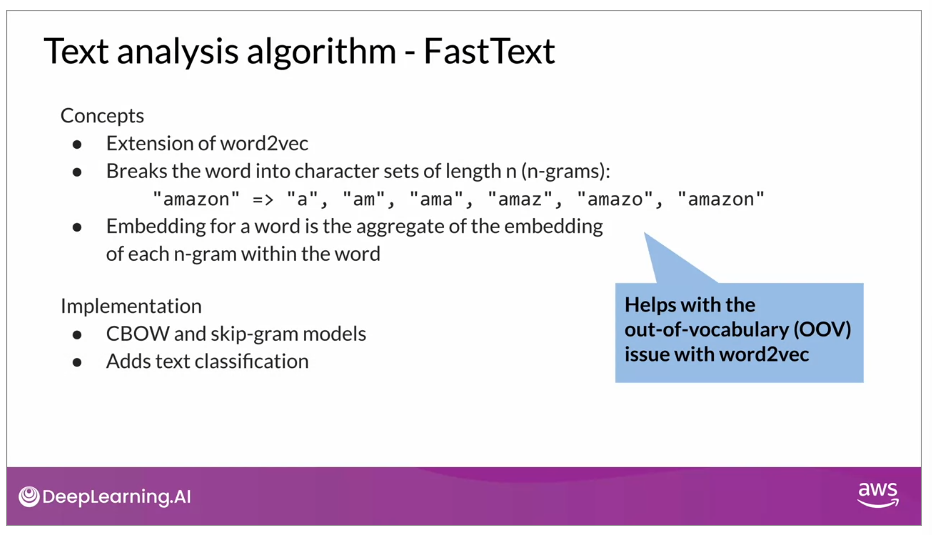

+ **Transformer** (June 2017): in the paper *Attention Is All You Need* the authors introduced a novel neural network architecture based on a self-attention mechanism. The concept of attention had been studied before for different model architectures and generally refers to one model component capturing the correlation between inputs and outputs. In NLP terms, attention would map each word from the model's output to the words in the input sequence, assigning them weights depending on their importance towards the predicted word. The self-attention mechanism in this new transformer architecture focuses on capturing the relationships between all words in the input sequence and thereby significantly improving the accuracy of natural language understanding tasks such as machine translation.

+ **BlazingText** (November 2017): 

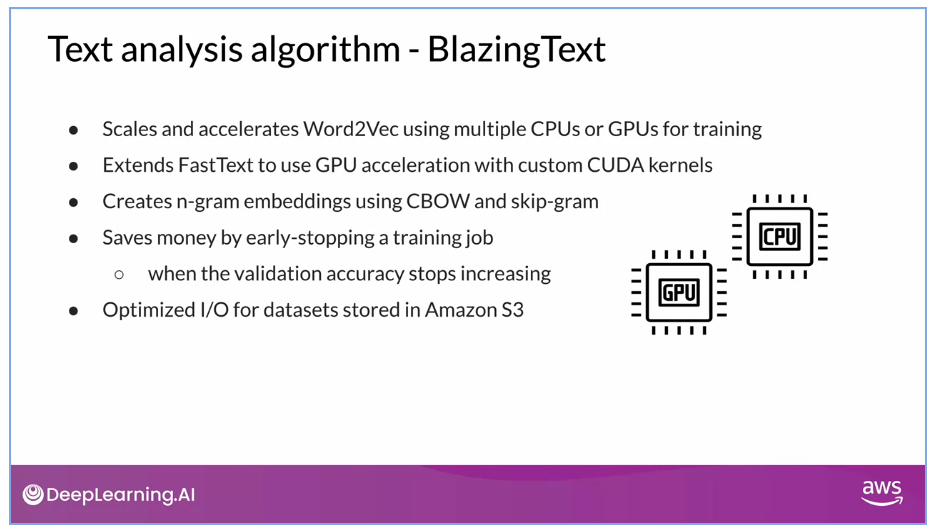

+ **ELMo** (February 2018): in *embeddings from language models* word vectors are learned by a deep bidirectional language model. ELMo combines forward and backward language model and is thus able to better capture syntax and semantics across different linguistic contexts.

+ **GPT** (July 2018): it improves language understanding by generative pre-training. GPT is based on the transformer architecture but performs two training steps. First, GPT learns a language model from a large unlabeled text corpus, and second GPT performs a supervised learning step with labeled data to learn a specific NLP task such as text classification. GPT is only trained and can predict context from left to right, which is often referred to as uni-directional. 

+ **BERT** (October 2018): *bidirectional encoder representation from transformers* is truly bidirectional. In the unsupervised training step, BERT learns representations from unlabeled text from left to right and right to left contexts jointly. This novel approach created interest in BERT across the industry an has led to many variations of BERT models. BERT is still among the most popular NLP models.

***[PAPERS](https://www.coursera.org/learn/automl-datasets-ml-models/supplement/MIB6J/additional-reading-material)***

## Train a Text Classifier
For this example we will look at a sentiment classification task.

1. Prepare the target variable, defining the sentiment classes (positive, neutral and negative)
2. Tokenize the reviews into one sentence per review
3. Define the hyperparameters

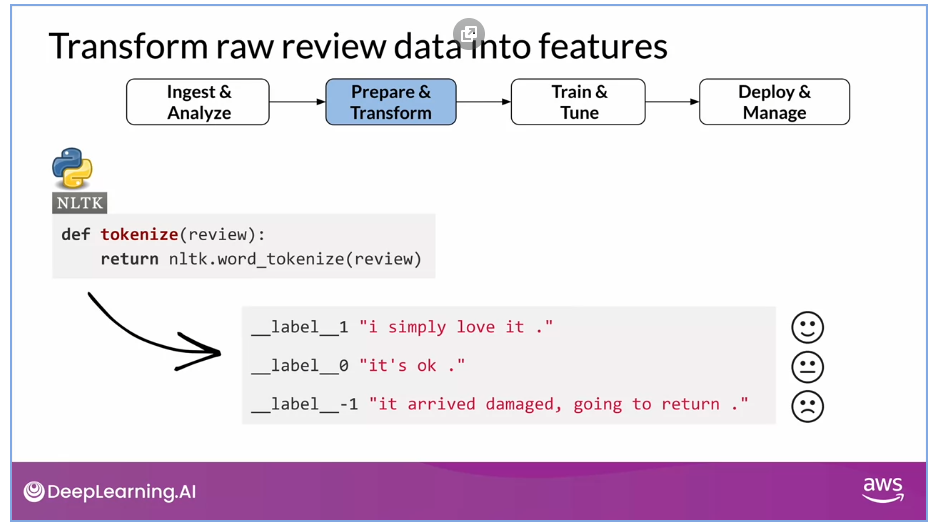

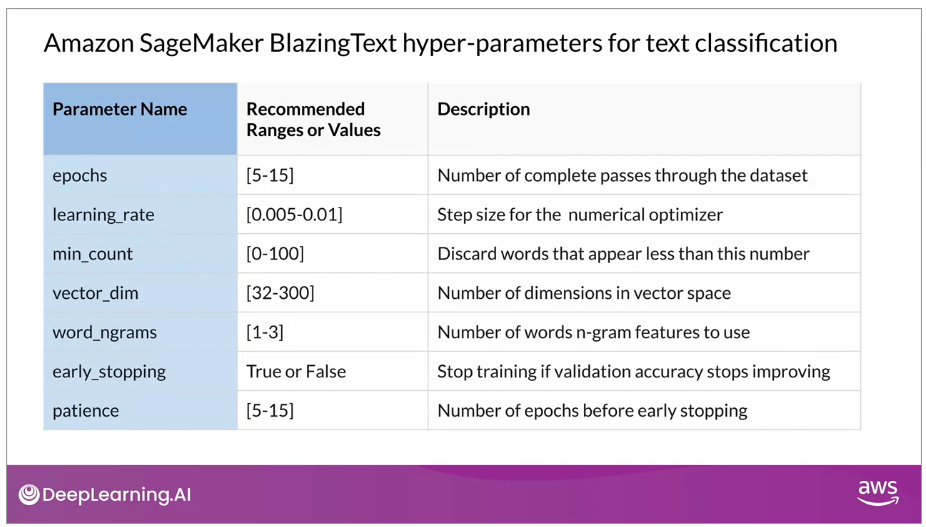

4. Configure the algorithm's data input channels to point to the uploaded training and validation files in S3. 

5. Retrieve the correct SageMaker model training image for BlazingTexts via the `image_uri` retrieve call. SageMaker offers pre-built docker images for built-in algorithms that contain all model code. The docker images are stored in a Docker Container Registry ,the Amazon Elastic Container Registry (Amazon ECR).
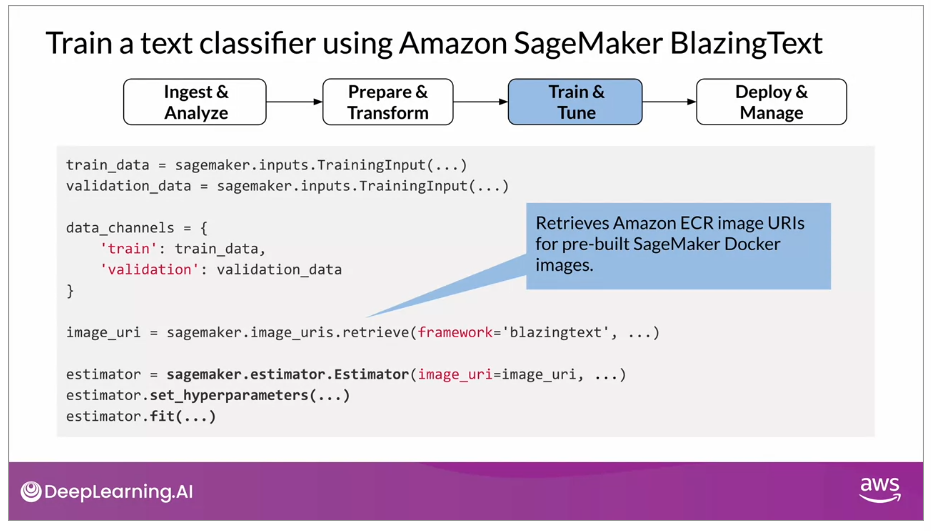



## Deploy the Text Classifier
With SageMaker you can simply call estimator deploy to deploy your trained model on a REST endpoint. The endpoint is an Amazon Elastic Compute Cloud (EC2) compute instance managed by SageMaker. You can choose the instance type and the number of instances to serve the model predictions.

SageMaker will take care of creating those instances and deploying the train model. You can increase the instance count here to anything larger than 1 to scale out your model hosting environment. SageMaker also creates and manages a REST API that you can use to send prediction requests to, and receive predictions results from. 

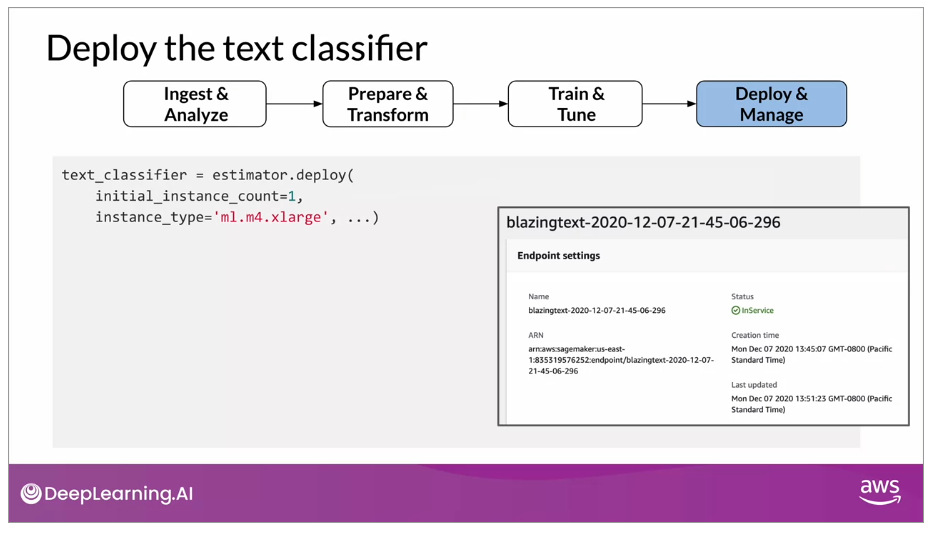

From your notebook environment, you can also run prediction requests using the text classifier predict call. The request form needs to be in Javascript object notation (JSON), with instances as the key, and the value set to a sample product review sentence. The model response is another JSON string with a predicted label class and the probability score of the prediction.

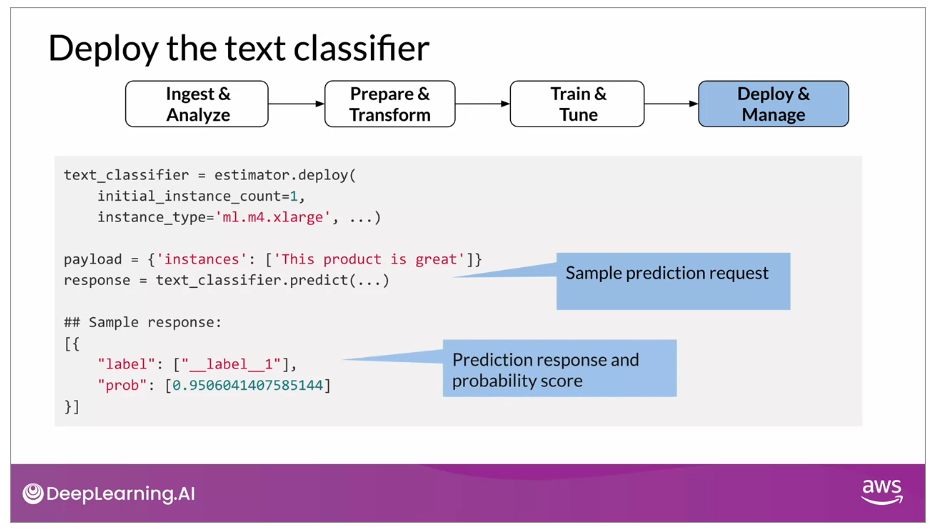